In [1]:
import sys
print(sys.path)
sys.path.append('/home/zinovyev/anaconda3/lib/python3.7/site-packages')
sys.path.append('/home/zinovyev/anaconda3/lib/python3.7/site-packages/skdim/')
sys.path.append('/mnt/c/MyPrograms/Python/_lib/')
print(sys.path)

['/mnt/c/MyPrograms/Python/CellCycle/Modeling', '/usr/lib/python37.zip', '/usr/lib/python3.7', '/usr/lib/python3.7/lib-dynload', '', '/home/zinovyev/.local/lib/python3.7/site-packages', '/usr/local/lib/python3.7/dist-packages', '/usr/lib/python3/dist-packages', '/home/zinovyev/.local/lib/python3.7/site-packages/IPython/extensions', '/home/zinovyev/.ipython']
['/mnt/c/MyPrograms/Python/CellCycle/Modeling', '/usr/lib/python37.zip', '/usr/lib/python3.7', '/usr/lib/python3.7/lib-dynload', '', '/home/zinovyev/.local/lib/python3.7/site-packages', '/usr/local/lib/python3.7/dist-packages', '/usr/lib/python3/dist-packages', '/home/zinovyev/.local/lib/python3.7/site-packages/IPython/extensions', '/home/zinovyev/.ipython', '/home/zinovyev/anaconda3/lib/python3.7/site-packages', '/home/zinovyev/anaconda3/lib/python3.7/site-packages/skdim/', '/mnt/c/MyPrograms/Python/_lib/']


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import anndata
import scanpy as sc
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from math import exp
import elpigraph
import warnings
warnings.filterwarnings("ignore")
from elpigraph_ps_tools import *
from scipy.interpolate import UnivariateSpline
from scipy.signal import find_peaks
from matplotlib import cm
viridis = cm.get_cmap('viridis', 100)


def add_laplacian_noise(series,add_noise=0.1):
    series_noise = series*(1+np.random.laplace(0,1,series.shape[0])*add_noise)
    #series_noise = series+np.random.laplace(0,0.1,series.shape[0])*add_noise
    return series_noise

def add_additive_laplacian_noise(series,add_noise=0.1):
    series_noise = series+np.random.laplace(0,1,series.shape[0])*add_noise
    #series_noise = series+np.random.laplace(0,0.1,series.shape[0])*add_noise
    return series_noise


def _G1Sa(t):
    x = 0
    T = T1+Ts+T2+Tm
    n_periods = int(t/T)
    t = t-T*n_periods
    x0 = kt_g1s/kd2_g1s*(exp(kd2_g1s*(Ts))-1)/(s_fold*exp(kd2_g1s*(Ts+T2+Tm))-exp(-kd_g1s*T1))
    #x0 = 1
    if (t>=0) & (t<T1):
        x = x0*exp(-kd_g1s*t)
    if (t>=T1) & (t<T1+Ts):
        x = kt_g1s/kd2_g1s*(1-(1-kd2_g1s/kt_g1s*x0*exp(-kd_g1s*T1))*exp(-kd2_g1s*(t-T1)))
    if (t>=T1+Ts) & (t<T1+Ts+T2+Tm):
        x = kt_g1s/kd2_g1s*(1-(1-kd2_g1s/kt_g1s*x0*exp(-kd_g1s*T1))*exp(-kd2_g1s*(Ts)))*exp(-kd2_g1s*(t-T1-Ts))
    return x

def G1Sa(t_series):
    x_series = []
    for t in t_series:
        x = _G1Sa(t)
        x_series.append(x)
    return np.array(x_series)

def G1S_RHS(t,x):
    rhs = 0
    T = T1+Ts+T2+Tm
    n_periods = int(t/T)
    t = t-T*n_periods
    if (t>=0) & (t<T1):
        rhs = -kd_g1s*x
    if (t>=T1) & (t<T1+Ts):
        rhs = -kd2_g1s*x+kt_g1s
    if (t>=T1+Ts) & (t<T):
        rhs = -kd2_g1s*x
    return rhs

def G1S_RHSa(t_series,x0):
    x_series = []
    x = x0
    for t in t_series:
        x = G1S_RHS(t,x)
        x_series.append(x)
    return np.array(x_series)


def _G2Ma(t):
    x = 0
    T = T1+Ts+T2+Tm
    n_periods = int(t/T)
    t = t-T*n_periods
    #x0 = kt_g2m/kd2_g2m*(exp(kd2_g2m*(Ts+T2))-1)/(m_fold*exp(kd2_g2m*(Ts+T2+Tm))-exp(-kd_g2m*T1))
    x0 = kt_g2m/kd2_g2m*(kt_m_fold*exp(kd2_g2m*(Ts+T2))-(kt_m_fold-1)*exp(kd2_g2m*Ts)-1)/(m_fold*exp(kd2_g2m*(Ts+T2+Tm))-exp(-kd_g2m*T1))
    if (t>=0) & (t<T1):
        x = x0*exp(-kd_g2m*t)
    #if (t>=T1) & (t<T1+Ts+T2):
    #    x = kt_g2m/kd2_g2m*(1-(1-kd2_g2m/kt_g2m*x0*exp(-kd_g2m*T1))*exp(-kd2_g2m*(t-T1)))
    #if (t>=T1+Ts+T2) & (t<T1+Ts+T2+Tm):
    #    x = kt_g2m/kd2_g2m*(1-(1-kd2_g2m/kt_g2m*x0*exp(-kd_g2m*T1))*exp(-kd2_g2m*(Ts+T2)))*exp(-kd2_g2m*(t-T1-Ts-T2))
    if (t>=T1) & (t<T1+Ts):
        x = kt_g2m/kd2_g2m*(1-(1-kd2_g2m/kt_g2m*x0*exp(-kd_g2m*T1))*exp(-kd2_g2m*(t-T1)))
    if (t>=T1+Ts) & (t<T1+Ts+T2):
        x = kt_g2m/kd2_g2m*(kt_m_fold-(1-kd2_g2m/kt_g2m*x0*exp(-kd_g2m*T1)+exp(kd2_g2m*Ts)*(kt_m_fold-1))*exp(-kd2_g2m*(t-T1)))
    if (t>=T1+Ts+T2) & (t<T1+Ts+T2+Tm):
        x = kt_g2m/kd2_g2m*(kt_m_fold-(1-kd2_g2m/kt_g2m*x0*exp(-kd_g2m*T1)+exp(kd2_g2m*Ts)*(kt_m_fold-1))*exp(-kd2_g2m*(Ts+T2)))*exp(-kd2_g2m*(t-T1-Ts-T2))
        
    return x

def G2Ma(t_series):
    x_series = []
    for t in t_series:
        x = _G2Ma(t)
        x_series.append(x)
    return np.array(x_series)

def G2M_RHS(t,x):
    rhs = 0
    T = T1+Ts+T2+Tm
    n_periods = int(t/T)
    t = t-T*n_periods
    if (t>=0) & (t<T1):
        rhs = -kd_g2m*x
    if (t>=T1) & (t<T1+Ts):
        rhs = -kd2_g2m*x+kt_g2m
    if (t>=T1+Ts) & (t<T1+Ts+T2):
        rhs = -kd2_g2m*x+kt_m_fold*kt_g2m
    if (t>=T1+Ts+T2) & (t<T):
        rhs = -kd2_g2m*x
    return rhs

def G2M_RHSa(t_series,x0):
    x_series = []
    x = x0
    for t in t_series:
        x = G2M_RHS(t,x)
        x_series.append(x)
    return np.array(x_series)


def TC_RHS(t,x,base_line_counts):
    T = T1+Ts+T2+Tm
    n_periods = int(t/T)
    t = t-T*n_periods
    if (t>=0) & (t<T1):
        rhs = 0
    if (t>=T1):
        rhs = base_line_counts/(Ts+T2+Tm)
    return rhs

def TC(t0,t1,x0,base_line_counts,n_points=1000):
    nsteps = n_points
    dt = (t1-t0)/nsteps
    x_series = np.zeros(nsteps)
    t_series = np.zeros(nsteps)
    x = x0
    t = t0
    x_series[0] = x0
    t_series[0] = t0
    for i in range(1,nsteps):
        x = x+dt*TC_RHS(t,x,base_line_counts)
        t = t+dt
        x_series[i] = x    
        t_series[i] = t
    return [t_series,x_series]

def compute_principal_curve_from_circle(X,n_nodes=30,Mu=0.1,Lambda=0.01, produceTree=False):
    egr = elpigraph.computeElasticPrincipalCircle(X,int(n_nodes/2),Mu=Mu)
    nodep = egr[0]['NodePositions']
    edges = egr[0]['Edges'][0]
    partition, dists = elpigraph.src.core.PartitionData(X = X, NodePositions = nodep, 
                                                            MaxBlockSize = 100000000, TrimmingRadius = np.inf,
                                                            SquaredX = np.sum(X**2,axis=1,keepdims=1))
    node_sizes = np.array([len(np.where(partition==i)[0]) for i in range(nodep.shape[0])])
    node_min = np.argmin(node_sizes)
    edges_open = edges.copy()
    k = 0
    starting_node = -1
    while k<edges_open.shape[0]:
        e = edges_open[k,:]
        if (e[0]==node_min)|(e[1]==node_min):
            edges_open = np.delete(edges_open,k,axis=0)
            if e[0]==node_min:
                starting_node = e[1]
            if e[1]==node_min:
                starting_node = e[0]                
        else:
            k = k+1
    nodep_open = np.delete(nodep,node_min,axis=0)
    if starting_node>node_min:
        starting_node = starting_node-1
    for e in edges_open:
        if e[0]>node_min:
            e[0]=e[0]-1
        if e[1]>node_min:
            e[1]=e[1]-1
    if produceTree:
        egrl = elpigraph.computeElasticPrincipalTree(X,n_nodes,InitNodePositions=nodep_open,
                                                 InitEdges=edges_open,Lambda=Lambda,Mu=Mu,
                                                 alpha=0.01,FinalEnergy='Penalized')
    else:
        egrl = elpigraph.computeElasticPrincipalCurve(X,n_nodes,InitNodePositions=nodep_open,
                                                 InitEdges=edges_open,Lambda=Lambda,Mu=Mu,
                                                 alpha=0.01,FinalEnergy='Penalized')
    return egrl, starting_node

def calc_curvature(nodep,smoothing_factor=10):
    splines = []
    derivs = []
    for i in range(nodep.shape[1]):
        xv = np.linspace(0,nodep.shape[0]-1,nodep.shape[0])
        yv = nodep[:,i]
        #xv = np.array([-1]+list(xv)+[xv[-1]+1])
        #yv = np.array([2*yv[0]-yv[1]]+list(yv)+[2*yv[-1]-yv[-2]])
        #plt.plot(xv,yv,'-o')
        spline = UnivariateSpline(xv,yv,s=0,k=3)
        splines.append(spline)
        derivs.append(spline.derivative(n=2))
    n_points = nodep.shape[0]
    curv = np.zeros(nodep.shape[0])
    x = np.linspace(0,nodep.shape[0]-1,n_points)
    temp = np.zeros((n_points,nodep.shape[1]))
    print(temp.shape)
    for i in range(len(derivs)):
        temp[:,i] = derivs[i](x)
    curv = np.sqrt(np.sum(temp**2,axis=1))
    curv_spl = UnivariateSpline(x,curv,s=np.var(curv)*smoothing_factor,k=3)
    return x, curv_spl(x), splines
    
def print_all_parameters():
    print('kd_g1s=',kd_g1s)    
    print('kd_g2m=',kd_g2m)    
    print('kd2_g1s=',kd2_g1s)    
    print('kd2_g2m=',kd2_g2m)    
    print('kt_g1s=',kt_g1s)    
    print('kt_g2m=',kt_g2m)   
    print('kt_m_fold=',kt_m_fold)
    print('kt_m_fold=',kt_m_fold)    
    print('m_fold=',m_fold)
    print('s_fold=',s_fold)
    print('T1=',T1)
    print('Ts=',Ts)
    print('T2=',T2)
    print('Tm=',Tm)
    
def find_nonproliferative_cells(adata,estimation_fraction_nonproliferating_cells=0.3, 
                                number_of_nodes=-1,max_number_of_iterations = 20,
                               number_of_sigmas=3.0,Mu=1.0):
    all_markers = list(adata.uns['S-phase_genes'])+list(adata.uns['G2-M_genes'])
    Xccm = adata[:,list(set(all_markers)&set(adata.var_names))].X
    cc_score = np.array(list(np.mean(Xccm,axis=1)))

    ind_sorted_prolif = np.argsort(cc_score)
    ind_nonprolif = ind_sorted_prolif[0:int(len(adata)*estimation_fraction_nonproliferating_cells)]
    adata.obs['proliferating'] = np.empty(len(adata)).astype(np.bool)
    adata.obs['proliferating'][:] = True
    adata.obs['proliferating'][ind_nonprolif] = False
    
    sc.pl.scatter(adata,x='S-phase',y='G2-M',color='proliferating')

    fraction_nonprolif_old = estimation_fraction_nonproliferating_cells

    for i in range(max_number_of_iterations):
        X_elpigraph_training = adata.obs[['S-phase','G2-M']].to_numpy().astype(np.float64)
        u = X_elpigraph_training.copy()
        X_elpigraph_training = X_elpigraph_training[adata.obs['proliferating'],:]
        
        if number_of_nodes<0:
            number_of_nodes=np.min([np.max([np.sqrt(adata.X.shape[0]),20]),50])

        egr = elpigraph.computeElasticPrincipalCircle(X_elpigraph_training,number_of_nodes,
                                                      Mu=Mu,drawPCAView=False,verbose=False)
        partition, dists = elpigraph.src.core.PartitionData(X = u, NodePositions = egr[0]['NodePositions'], 
                                                                MaxBlockSize = 100000000, TrimmingRadius = np.inf,
                                                                SquaredX = np.sum(u**2,axis=1,keepdims=1))
        ind_prolif = adata.obs['proliferating']
        mndist = np.mean(dists[ind_prolif])
        intervaldist = np.std(dists[ind_prolif])*number_of_sigmas
        tt1 = [not b for b in adata.obs['proliferating']]
        tt2 = [(d>mndist+intervaldist)[0] for d in dists]
        nonprolif_new = np.array(tt1) & np.array(tt2)
        adata.obs['proliferating'] = [not b for b in nonprolif_new]
        fraction_nonprolif = 1-np.sum(adata.obs['proliferating'])/len(adata)
        print('\n\n===========\nIteration',i,'Fraction of non-proliferating cells:',fraction_nonprolif,'\n==============\n\n\n')    
        if np.abs(fraction_nonprolif-fraction_nonprolif_old)<0.01:
            break
        fraction_nonprolif_old = fraction_nonprolif

        
def _make_G1SG2M_plot(adata, egr, n_components=30, delta=0.05, subsample=None,highlighted_nodes=None,draw_principal_curve=False,alpha=0.5, scaling_factor=1.0, n_top_genes=2001,score_type='additive',arrow_width=0.003):
    fig = plt.figure(figsize=(5,8))
    plt.rcParams.update({'font.size': 12})
    X = adata.X

    X = adata.X
    X_prolif = adata.X[np.where(adata.obs['proliferating']==1)[0],:]
    mn_prolif = np.mean(X_prolif,axis=0)    
    
    pca = PCA(n_components=n_components)
    u = pca.fit_transform(X_prolif)
    v = pca.components_.T
    
    mn = mn_prolif
    
    tc_name = 'total_counts_raw'
    if not tc_name in adata.obs:
        tc_name = 'total_counts'
    tc = adata.obs[tc_name]
    tc = scipy.stats.mstats.winsorize(tc,limits=[0.1,0.1])
    tc = (tc-np.min(tc))/(np.max(tc)-np.min(tc))*100
    velocity_X = adata.layers['velocity']

    X1 = X + velocity_X*delta*1
    X2 = np.concatenate((X,X1),axis=0)
    adata_temp = anndata.AnnData(X = X2)
    adata_temp.obs_names = list(adata.obs_names)*2
    adata_temp.var_names = adata.var_names
    adata_temp.obs['total_counts'] = list(adata.obs['total_counts'])*2

    sc.pp.highly_variable_genes(adata_temp,n_top_genes=n_top_genes,n_bins=20)
    ind_genes2k = np.where(adata_temp.var['highly_variable'])[0]
    adata2k = adata_temp[:,ind_genes2k]
    signature_dict = {'S-phase':adata.uns['S-phase_genes'],'G2-M':adata.uns['G2-M_genes']}
    if score_type=='additive':
        scores_dic = calc_scores_additive(adata_temp,signature_dict)
    else:
        scores_dic = calc_scores(adata_temp,signature_dict)    
    for s in scores_dic:
        adata_temp.obs[s] = scores_dic[s]

    n = X.shape[0]

    x1 = adata_temp.obs[['S-phase','G2-M']].to_numpy()[0:n]
    #print(x1.shape)
    x2 = adata_temp.obs[['S-phase','G2-M']].to_numpy()[n:2*n]

    nodep = egr[0]['NodePositions']
    edges = egr[0]['Edges'][0]
    
    n_nodes = nodep.shape[0]
    nodes_projection = np.zeros((n_nodes,2))
    node_real_coordinates = nodep@v.T+mn

    adata_nodes = anndata.AnnData(X = node_real_coordinates)
    adata_nodes.var_names = adata.var_names
    if score_type=='additive':    
        scores_dic_nodes = calc_scores_additive(adata_nodes,signature_dict)
    else:
        scores_dic_nodes = calc_scores(adata_nodes,signature_dict)    
    for s in scores_dic_nodes:
        adata_nodes.obs[s] = scores_dic_nodes[s]

    #for i in range(n_nodes):
    #    nodes_projection[i,:] = np.mean(x1[np.where(partition==i)[0],:],axis=0)

    #cc.pp.score_cell_cycle(adata_temp)
    ax = fig.add_subplot(1,1,1)
    if subsample is None:
        subsample = range(n)
    ax.scatter(x1[subsample,0]*scaling_factor,x1[subsample,1]*scaling_factor,c=adata.obs['total_counts'][subsample],s=0.1)

    #plt.scatter(x1[:,0],x1[:,1],c='k',s=1)
    #plt.scatter(x2[:,0],x2[:,1],c='b',s=1)

    for i in subsample:
        p1 = x1[i,:]*scaling_factor
        p2 = (x2[i,:]-x1[i,:])*scaling_factor
        if adata.obs['proliferating'][i]:
            plt.arrow(p1[0],p1[1],p2[0],p2[1],width=arrow_width,color=viridis(int(tc[i])),edgecolor=None,alpha=alpha)
        else:
            plt.arrow(p1[0],p1[1],p2[0],p2[1],width=arrow_width,color='grey',edgecolor=None,alpha=alpha)
        #plt.plot([p1[0],p2[0]],[p1[1],p2[1]],'k-')
    plt.xlabel('S-phase score',fontsize=15)
    plt.ylabel('G2-M score',fontsize=15)
    node_scores = adata_nodes.obs[['S-phase','G2-M']].to_numpy()
    if draw_principal_curve:
        for e in edges:
            #plt.plot([nodes_projection[e[0],0],nodes_projection[e[1],0]],
            #         [nodes_projection[e[0],1],nodes_projection[e[1],1]],'b-',linewidth=10)
            plt.plot([node_scores[e[0],0]*scaling_factor,node_scores[e[1],0]]*scaling_factor,
                     [node_scores[e[0],1]*scaling_factor,node_scores[e[1],1]]*scaling_factor,'r-',linewidth=3,alpha=0.5)
        if highlighted_nodes is not None:
            for k in highlighted_nodes:
                plt.plot(node_scores[k,0]*scaling_factor,node_scores[k,1]*scaling_factor,'ro',markersize=15,alpha=0.5)
            
    return node_scores, x1
    #plt.axis('equal')
    #plt.axis('off')
    #plt.axis(fontsize=20)
    #ax.xaxis.get_major_ticks().label.set_fontsize(20) 
    #plt.savefig(dataset_name+'_G1S_G2M.png')
    #plt.show()    
    
def calc_scores(anndata,signature_dict):
    matrix = anndata.to_df().to_numpy()
    scores_dic = {}
    for key in signature_dict:
        names = np.array(signature_dict[key])
        inds = np.where(np.isin(anndata.var_names,names))[0]
        matrix_sel = matrix[:,inds]
        matrix_sel/=np.log(10)
        scores = np.mean(matrix_sel,axis=1)
        scores_dic[key] = scores
    return scores_dic


def calc_scores_additive(anndata,signature_dict):
    matrix = anndata.to_df().to_numpy()
    scores_dic = {}
    for key in signature_dict:
        names = np.array(signature_dict[key])
        inds = np.where(np.isin(anndata.var_names,names))[0]
        matrix_sel = matrix[:,inds]
        #scores = np.mean(matrix_sel,axis=1)
        matrix_sel = np.exp(matrix_sel)
        scores = np.mean(matrix_sel,axis=1)
        scores = np.log10(scores)
        scores_dic[key] = scores
    return scores_dic


def parameters_from_T2p(T2p_guess):
    
    Tmp = (sm-sf)/(smax-sm)*T2p_guess
    bss = np.exp(np.log(10)*(smax-sm)/T2p_guess)
    bsm = np.exp(np.log(10)*(mmax-mf)/Tmp)
    b2m = bsm**(T2p_guess)
    
    # From where it follows?
    pts = (bss*10**smax-10**s1)/(bss-1)
    ### CHECK THIS ONE!
    #ptm = (b2m*10**mmax-10**ms)/(b2m-1)/kt_m_fold
    ptm = (bsm*10**ms-10**m1)/(bsm-1)
    #ptm = (b2m*10**mmax-10**ms)/(b2m-1)
    #kt_m_fold = 1/ptm*(10**mmax*b2m-10**ms)/(b2m-1)
    #print('kt_m_fold=',kt_m_fold)    
    #ptm = (b2m*bsm*10**mmax-10**m1)/(bsm*(1-kt_m_fold+kt_m_fold*b2m)-1)
    #ptm = (b2m*bsm*10**mmax-10**m1)/(bsm*b2m-1)
    #ptm = (bsm*10**ms-10**m1)/(bsm*(1-kt_m_fold+kt_m_fold*b2m)-1)
    #xmax = (10**mmax*b2m-10**ms)/(b2m-1)/kt_m_fold
    #xs = (10**ms*bsm-10**m1)/(bsm-1)
    #print('xs-xmax=',xs-xmax)
    return Tmp,bss,bsm,b2m,pts,ptm,kt_m_fold

def plot_simulated_dynamics(number_of_points=1000,noise_level=0.0):
    g1sa = np.log10(add_laplacian_noise(G1Sa(times),add_noise=noise_level))
    g2ma = np.log10(add_laplacian_noise(G2Ma(times),add_noise=noise_level))
    plt.plot(g1sa,g2ma,'ko')
    plt.xlabel('G1S',fontsize=14)
    plt.ylabel('G2M',fontsize=14)
    return g1sa, g2ma

def compute_parameters(T2p,Tmp,bss,bsm,pts,ptm,kt_m_fold):
    T2 = T2p*Ts
    Tm = Tmp*Ts
    kd_g1s = np.log(10)*(s0-s1)/T1
    kd_g2m = np.log(10)*(m0-m1)/T1
    kd2_g1s = np.log(bss)/Ts
    kd2_g2m = np.log(bsm)/Ts
    kt_g1s = pts*kd2_g1s
    kt_g2m = ptm*kd2_g2m
    s_fold = 10**(sf-s0)
    m_fold = 10**(mf-m0)
    return T2,Tm,kd_g1s,kd_g2m,kd2_g1s,kd2_g2m,kt_g1s,kt_g2m,kt_m_fold,m_fold,s_fold

    
def compute_parameters_as_function_T2p(T2p_guess):
    Tmp,bss,bsm,b2m,pts,ptm,kt_m_fold = parameters_from_T2p(T2p_guess)
    return compute_parameters(T2p_guess,Tmp,bss,bsm,pts,ptm,kt_m_fold)

    
def find_optimal_T2p(T2p_min,T2p_max,number_of_iterations=100,plotting_x0=False,sigma=0.001):
    T2p_tries = []
    errors = []
    T2p_mn = T2p_min
    T2p_mx = T2p_max
    for i in range(number_of_iterations):
        guesses = np.array([T2p_mn,(T2p_mx+T2p_mn)/2-sigma,(T2p_mx+T2p_mn)/2+sigma,T2p_mx])
        guesses_errors = np.zeros(4)
        for i,T2p_guess in enumerate(guesses):
            err_val,s0_est,m0_est = _error_T2p_estimation(T2p_guess)
            if np.isnan(err_val):
                if len(errors)>0:
                    err_val = np.max(errors)
                else:
                    err_val = 10
            errors.append(err_val)
            T2p_tries.append(T2p_guess)
            if plotting_x0:
                plt.plot(s0_est,m0_est,'ko')
            guesses_errors[i] = err_val
        if guesses_errors[1]<guesses_errors[2]:
            T2p_mn = T2p_mn
            T2p_mx = (T2p_mx+T2p_mn)/2-sigma
        else:
            T2p_mn = (T2p_mx+T2p_mn)/2+sigma
            T2p_mx = T2p_mx
    T2p_guess = (T2p_mn+T2p_mx)/2
    no_solution_flag = False
    if np.abs((T2p_guess-T2p_min)/T2p_min)<sigma:
        no_solution_flag = True
    if np.abs((T2p_guess-T2p_max)/T2p_max)<sigma:
        no_solution_flag = True
    
    return T2p_guess, no_solution_flag, T2p_tries, errors

def _error_T2p_estimation(T2p):
    T2,Tm,kd_g1s,kd_g2m,kd2_g1s,kd2_g2m,kt_g1s,kt_g2m,kt_m_fold,m_fold,s_fold = compute_parameters_as_function_T2p(T2p)
    #print('in computing error kt_m_fold=',kt_m_fold)    
    s0_est = kt_g1s/kd2_g1s*(exp(kd2_g1s*(Ts))-1)/(s_fold*exp(kd2_g1s*(Ts+T2+Tm))-exp(-kd_g1s*T1))
    #m0_est = np.log10(kt_g2m/kd2_g2m*(exp(kd2_g2m*(Ts+T2))-1)/(m_fold*exp(kd2_g2m*(Ts+T2+Tm))-exp(-kd_g2m*T1)))
    m0_est = kt_g2m/kd2_g2m*(kt_m_fold*exp(kd2_g2m*(Ts+T2))-(kt_m_fold-1)*exp(kd2_g2m*Ts)-1)/(m_fold*exp(kd2_g2m*(Ts+T2+Tm))-exp(-kd_g2m*T1))
    s1_est = s0_est*exp(-kd_g1s*T1)
    m1_est = m0_est*exp(-kd_g2m*T1)
    smax_est = kt_g1s/kd2_g1s*(1-(1-kd2_g1s/kt_g1s*s1_est)*exp(-kd2_g1s*Ts))
    ms_est = kt_g2m/kd2_g2m*(1-(1-kd2_g2m/kt_g2m*m1_est)*exp(-kd2_g2m*Ts))
    sm_est = smax_est*exp(-kd2_g1s*T2)
    mmax_est = kt_m_fold*kt_g2m/kd2_g2m*(1-(1-kd2_g2m/kt_m_fold/kt_g2m*ms_est)*exp(-kd2_g2m*T2))
    sf_est = sm_est*exp(-kd2_g1s*Tm)
    mf_est = mmax_est*exp(-kd2_g2m*Tm)
    
    s0_est = np.log10(s0_est)
    m0_est = np.log10(m0_est)
    s1_est = np.log10(s1_est)
    m1_est = np.log10(m1_est)
    smax_est = np.log10(smax_est)
    ms_est = np.log10(ms_est)
    sm_est = np.log10(sm_est)
    mmax_est = np.log10(mmax_est)
    sf_est = np.log10(sf_est)
    mf_est = np.log10(mf_est)
    
    err_val = (s0-s0_est)**2+(m0-m0_est)**2+ \
                    (s1-s1_est)**2+(m1-m1_est)**2+ \
                    (smax-smax_est)**2+(ms-ms_est)**2+ \
                    (sm-sm_est)**2+(mmax-mmax_est)**2+ \
                    (sf-sf_est)**2+(mf-mf_est)**2
        
    return err_val,s0_est,m0_est

def scatter_with_histograms(x,y,xlabel='',color='k',size=1,ylabel='',xlim=None, ylim=None,bins=50,left=0.1,width=0.65,bottom=0.1,height=0.65,spacing=0.005):
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom + height + spacing, width, 0.2]
    rect_histy = [left + width + spacing, bottom, 0.2, height]
    # start with a rectangular Figure
    ax_scatter = plt.axes(rect_scatter)
    plt.xlabel(xlabel,fontsize=14)
    plt.ylabel(ylabel,fontsize=14)
    ax_scatter.tick_params(direction='in', top=True, right=True)
    ax_histx = plt.axes(rect_histx)
    ax_histx.tick_params(direction='in', labelbottom=False)
    ax_histy = plt.axes(rect_histy)
    ax_histy.tick_params(direction='in', labelleft=False)
    # the scatter plot:
    ax_scatter.scatter(x, y, c=color, s=size)
    # now determine nice limits by hand:
    binwidth = 0.25
    lim = np.ceil(np.abs([x, y]).max() / binwidth) * binwidth
    if not (xlim is None):
        ax_scatter.set_xlim(xlim)
    if not (ylim is None):
        ax_scatter.set_ylim(ylim)
    ax_histx.hist(x, bins=bins,color=color)
    ax_histy.hist(y, bins=bins, orientation='horizontal',color=color)
    ax_histx.set_xlim(ax_scatter.get_xlim())
    ax_histy.set_ylim(ax_scatter.get_ylim())
    print('Correlation=',np.corrcoef(x,y)[0,1])
    print('Total std=',np.std([x,y]))
    squared_mean = np.mean(x)**2+np.mean(y)**2
    print('Van Valen\'s CV=',np.sqrt(np.var(x)/squared_mean+np.var(y)/squared_mean))

# Global constants
# T1 = 1
# Ts = 0.5
# T2 = 0.3
# Tm = 0.01
# T = T1+Ts+T2+Tm
# m_fold = 2
# kd_g2m = 2
# kd2_g2m = 1
# kt_g2m = 200
# kd_g1s = 2
# kd2_g1s = 1
# kt_g1s = 200


/home/zinovyev/.local/lib/python3.7/site-packages/numba/errors.py:137: UserWarning: Insufficiently recent colorama version found. Numba requires colorama >= 0.3.9
  warnings.warn(msg)


# Loading pre-computed dataset and trajectory

In [3]:
dataset_name = '/mnt/c/Datas/SingleCellTranscriptomics/RNAVelocity/CHLA9'
adata = sc.read_h5ad(dataset_name+'_renorm_proc.h5ad')
print(adata)

AnnData object with n_obs × n_vars = 4137 × 10001
    obs: 'TotalUMIs', 'total_counts', 'n_genes_by_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_raw', 'proliferating', 'S-phase', 'G2-M', 'G2-M-', 'Histone_IC'
    var: 'Accession', 'AccessionVersion', 'Aliases', 'CcdsID', 'Chromosome', 'ChromosomeEnd', 'ChromosomeStart', 'CosmicID', 'DnaBindingDomain', 'FullName', 'GeneType', 'HgncID', 'IsTF', 'Location', 'LocationSortable', 'LocusGroup', 'LocusType', 'MgdID', 'MirBaseID', 'OmimID', 'PubmedID', 'RefseqID', 'RgdID', 'UcscID', 'UniprotID', 'VegaID', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CurvaturePeaks', 'Edges', 'ElasticGraph', 'ElasticGraph_edges', 'ElasticGraph_nodes', 'G2-M_INH_genes', 'G2-M_genes', 'Histone_IC_genes', 'NodePositions', 'Points', 'PseudoTimeTraj', 'Pseudotime', 'S-phase_genes', 'Trajectory',

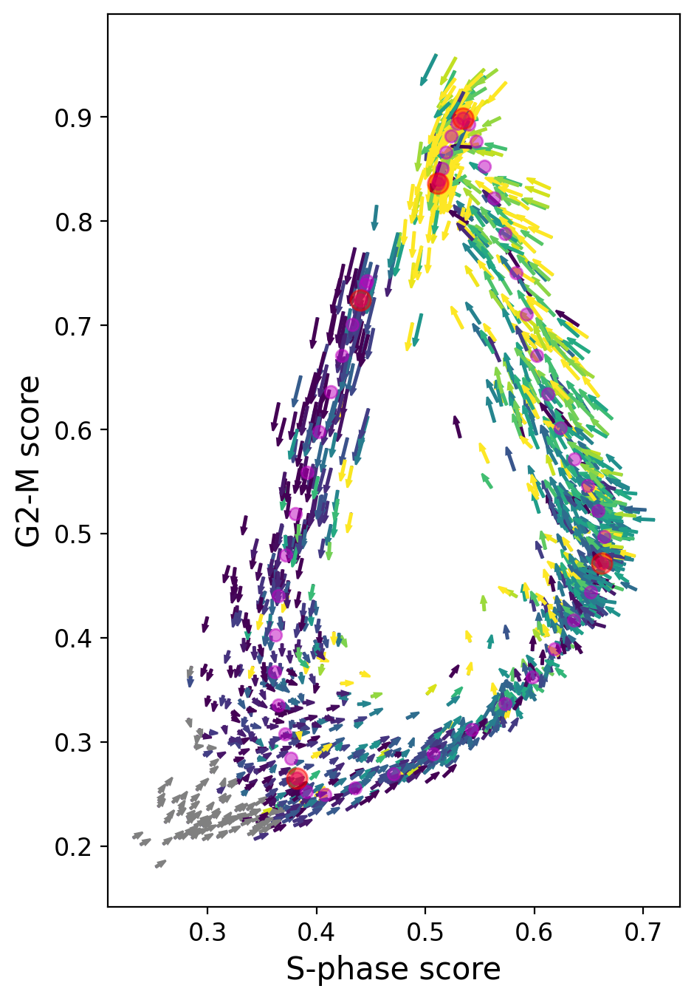

In [8]:
plt.rcParams['figure.dpi'] = 200

curvature_peaks = adata.uns['CurvaturePeaks']
nodep = adata.uns['ElasticGraph_nodes']
traj = adata.uns['Trajectory']
points = adata.uns['Points']
pst = adata.uns['Pseudotime']

subsample_size = 1500
#subsample_size = len(adata)
idx_subsample = np.random.choice(range(len(adata)),subsample_size,replace=False)

n_top_genes = 2000
score_type = 'simple'
#score_type = 'mean'

egr_final = {}
egr_final['NodePositions'] = adata.uns['ElasticGraph_nodes']
egr_final['Edges'] = tuple(adata.uns['ElasticGraph_edges'])

adata.X
node_scores, X = _make_G1SG2M_plot(adata,[egr_final],subsample=idx_subsample,draw_principal_curve=False,alpha=1.0,n_top_genes=n_top_genes,score_type=score_type,arrow_width=0.0015)

#node_scores = node_scores/log_conversion_factor

plt.plot(node_scores[:,0],node_scores[:,1],'mo',alpha=0.5)

X_nonprolif = X[adata.obs['proliferating']==0,:]
#x_0 = x_f - np.array([np.log10(2),np.log10(2)])
x0 = node_scores[traj[2],:]
#irx_nonprolif = np.argmax(np.sum(X_nonprolif,axis=1))
node_in_traj_1 = curvature_peaks[1]
x1 = node_scores[traj[curvature_peaks[1]-3],:]
#x1 = np.median(X_nonprolif,axis=0)
#x1 = np.mean(X_nonprolif,axis=0)
node_in_traj_s = curvature_peaks[2]
xs = node_scores[traj[curvature_peaks[2]],:]
xm = node_scores[traj[curvature_peaks[3]],:]
sm_temp = xm[0]
mmax_temp = xm[1]


xf = node_scores[traj[len(traj)-1],:]

# here is manual correction for CHLA9
#xf = xm+(xf-xm)*1.6
#xm = xf+(xm-xf)*0.6
#xm = xf+(xm-xf)*0.8


s0 = x0[0]
m0 = x0[1]
s1 = x1[0]
m1 = x1[1]
smax = xs[0]
ms = xs[1]
sm = xm[0]
mmax = xm[1]
sf = xf[0]
mf = xf[1]

g1s_exp = X[:,0]
g2m_exp = X[:,1]

plt.plot(x0[0],x0[1],'ro',markersize=10,alpha=0.5)
plt.plot(x1[0],x1[1],'ro',markersize=10,alpha=0.5)
plt.plot(xs[0],xs[1],'ro',markersize=10,alpha=0.5)
plt.plot(xm[0],xm[1],'ro',markersize=10,alpha=0.5)
plt.plot(xf[0],xf[1],'ro',markersize=10,alpha=0.5)


# Recompute scores
signature_dict = {'S-phase':adata.uns['S-phase_genes'],'G2-M':adata.uns['G2-M_genes']}
sc.pp.highly_variable_genes(adata,n_top_genes=n_top_genes,n_bins=20)
ind_genes2k = np.where(adata.var['highly_variable'])[0]
adata2k = adata[:,ind_genes2k]
if score_type=='additive':
    scores_dic = calc_scores_additive(adata2k,signature_dict)
else:
    scores_dic = calc_scores(adata2k,signature_dict)
for s in scores_dic:
    adata.obs[s] = scores_dic[s]


In [221]:
# Compute average velocity scores

adata_temp = adata.copy()
signature_dict = {'S-phase':adata.uns['S-phase_genes'],'G2-M':adata.uns['G2-M_genes']}
matrix = adata_temp.layers['velocity']
scores_dic = {}
for key in signature_dict:
    names = np.array(signature_dict[key])
    inds = np.where(np.isin(adata.var_names,names))[0]
    matrix_sel = matrix[:,inds]
    matrix_sel/=np.log(10)
    scores = np.mean(matrix_sel,axis=1)
    scores_dic[key] = scores
for s in scores_dic:
    adata_temp.obs[s] = scores_dic[s]

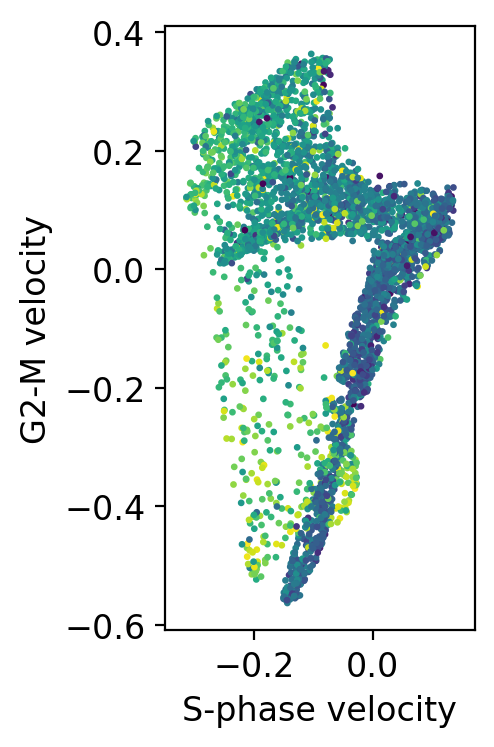

mean_vel_s= 0.14319819882512091
mean_vel_2= 0.32324990183115004
estimate_of_kt_m_fold= 1.5137414494933021


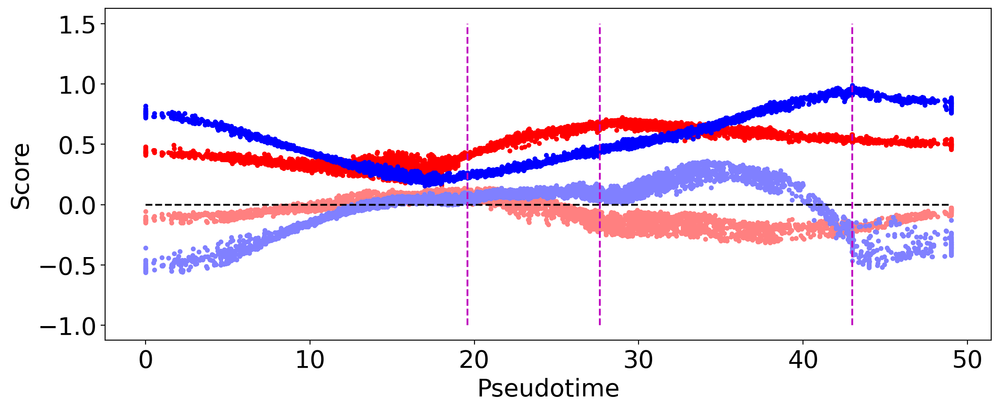

In [237]:
plt.figure(figsize=(2,4))
tc = adata_temp.obs['total_counts_raw']
plt.scatter(adata_temp.obs['S-phase'],adata_temp.obs['G2-M'],c=tc,s=2)
#sc.pl.scatter(adata_temp,x='S-phase',y='G2-M',color='total_counts_raw')
plt.axis('equal')
plt.xlabel('S-phase velocity')
plt.ylabel('G2-M velocity')
plt.savefig(dataset_name+'_G1S_G2M_velocity.png',dpi=600)
plt.show()

tmax = np.max(pst)

plt.figure(figsize=(13,5))
plt.plot(pst,adata[points,:].obs['S-phase'],'r.',label='S-phase')
plt.plot(pst,adata[points,:].obs['G2-M'],'b.',label='G2-M')
plt.plot(pst,adata_temp[points,:].obs['S-phase'],'r.',color=[1,0.5,0.5],label='S-phase velocity')
plt.plot(pst,adata_temp[points,:].obs['G2-M'],'b.',color=[0.5,0.5,1],label='G2-M velocity')
plt.plot([0,tmax],[0,0],'k--')

s_signal = adata[points,:].obs['S-phase']
m_signal = adata[points,:].obs['G2-M']
s_signal_v = adata_temp[points,:].obs['S-phase']
m_signal_v = adata_temp[points,:].obs['G2-M']
min_d = (s_signal-s1)**2+(m_signal-m1)**2
irx_1 = np.argmin(min_d)
min_d = (s_signal-smax)**2+(m_signal-ms)**2
irx_s = np.argmin(min_d)
#min_d = (m_signal-mmax)**2
irx_m = np.argmax(m_signal)
plt.plot([pst[irx_1],pst[irx_1]],[-1,1.5],'m--')
plt.plot([pst[irx_s],pst[irx_s]],[-1,1.5],'m--')
plt.plot([pst[irx_m],pst[irx_m]],[-1,1.5],'m--')
mean_vel_s = np.percentile(m_signal_v[range(irx_1,irx_s)],95)
mean_vel_2 = np.percentile(m_signal_v[range(irx_s,irx_m)],95)
#plt.plot([pst[irx_1],pst[irx_s]],[mean_vel_s,mean_vel_s],'b-')
#plt.plot([pst[irx_s],pst[irx_m]],[mean_vel_2,mean_vel_2],'b-')
print('mean_vel_s=',mean_vel_s)
print('mean_vel_2=',mean_vel_2)
kt_m_fold = 10**(mean_vel_2-mean_vel_s)
print('estimate_of_kt_m_fold=',kt_m_fold)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Pseudotime',fontsize=20)
plt.ylabel('Score',fontsize=20)
plt.savefig(dataset_name+'_G1S_G2M_velocity_ps.png',dpi=600)
#plt.legend()
plt.show()


kt_m_fold= 3.3
T2p_guess= 0.6877966239477769


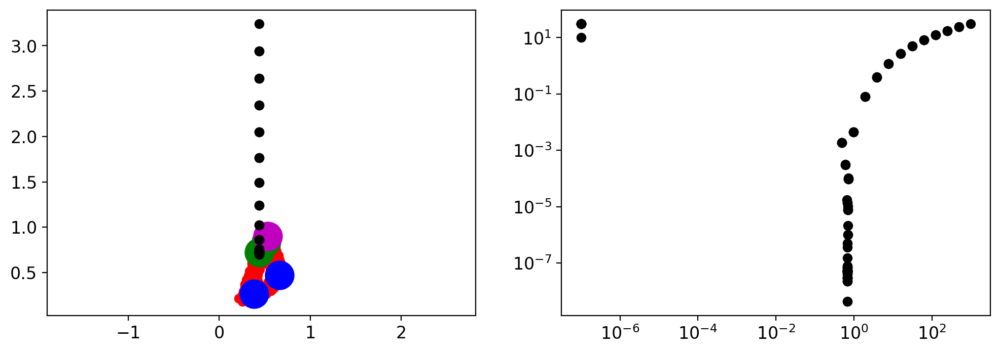

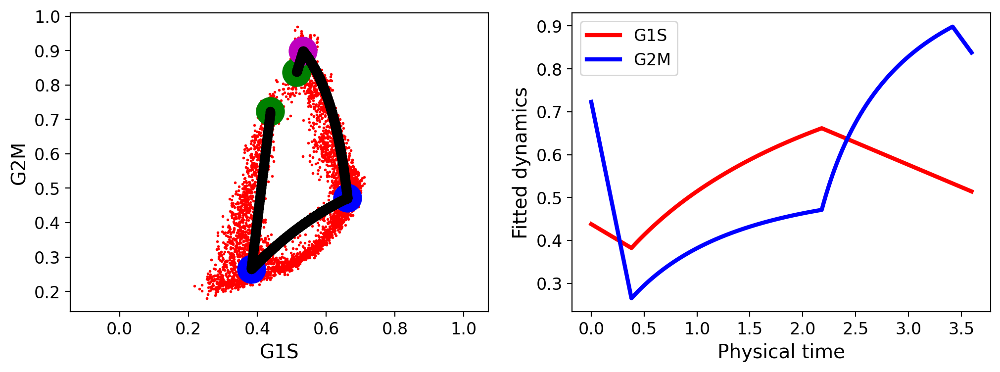

kd_g1s= 0.3379153960670837
kd_g2m= 2.7747959089018077
kd2_g1s= 0.2395420924136414
kd2_g2m= 0.7777206089227555
kt_g1s= 2.0663950819373564
kt_g2m= 2.5868079745238184
kt_m_fold= 3.3
kt_m_fold= 3.3
m_fold= 1.3020369473035038
s_fold= 1.191417870097576
T1= 0.38
Ts= 1.7999999999999998
T2= 1.2380339231059982
Tm= 0.1802259973588157
Ts/Tm= 9.987460335238662
T2/Ts= 0.6877966239477769


In [250]:
# Parameter estimation

#kt_m_fold = 5.7 # for the first round
kt_m_fold = 3.3
#kt_m_fold = 1.53

T1 = node_in_traj_1/nodep.shape[0]
#T1 = 1
Ts = (node_in_traj_s-node_in_traj_1)/nodep.shape[0]
Ts = Ts*10
#Ts = 0.1

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.plot(g1s_exp,g2m_exp,'ro')
plt.axis('equal')
plt.plot(x1[0],x1[1],'bo',markersize=20)
plt.plot(xs[0],xs[1],'bo',markersize=20)
plt.plot(x0[0],x0[1],'go',markersize=20)
plt.plot(xf[0],xf[1],'go',markersize=20)
plt.plot(xm[0],xm[1],'mo',markersize=20)
T2p_guess, no_solution_flag, T2p_tries, errors = find_optimal_T2p(0.0000001,1000,plotting_x0=True)

#T2p_opt = np.argmin(errors)

T2,Tm,kd_g1s,kd_g2m,kd2_g1s,kd2_g2m,kt_g1s,kt_g2m,kt_m_fold,m_fold,s_fold = compute_parameters_as_function_T2p(T2p_guess)
print('kt_m_fold=',kt_m_fold)
if no_solution_flag:
    print('WARNING: no local optimum for T2p was found!!!')
print('T2p_guess=',T2p_guess)

plt.subplot(1,2,2)
plt.loglog(T2p_tries,errors,'ko')

plt.show()

#compute_parameters_as_function_T2p(T2p)
#T2p_guess = 0.25
T2,Tm,kd_g1s,kd_g2m,kd2_g1s,kd2_g2m,kt_g1s,kt_g2m,kt_m_fold,m_fold,s_fold = compute_parameters_as_function_T2p(T2p_guess)

# plot the dynamics
T = T1+Ts+T2+Tm
times = np.arange(0,T,T/3000)    
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.plot(g1s_exp,g2m_exp,'ro',markersize=1)
plt.axis('equal')
plt.plot(x1[0],x1[1],'bo',markersize=20)
plt.plot(xs[0],xs[1],'bo',markersize=20)
plt.plot(x0[0],x0[1],'go',markersize=20)
plt.plot(xf[0],xf[1],'go',markersize=20)
plt.plot(xm[0],xm[1],'mo',markersize=20)

plot_simulated_dynamics(number_of_points=1000)

plt.subplot(1,2,2)
g1sa = np.log10(add_laplacian_noise(G1Sa(times),add_noise=0.0))
g2ma = np.log10(add_laplacian_noise(G2Ma(times),add_noise=0.0))

g1srhsa = []
g2mrhsa = []
for i in range(len(times)-1):
    der = (10**g1sa[i+1]-10**g1sa[i])/(times[i+1]-times[i])
    der = np.log10(np.abs(der))
    if der>2:
        der = 2
    g1srhsa.append(der)
    der = (10**g2ma[i+1]-10**g2ma[i])/(times[i+1]-times[i])
    der = np.log10(np.abs(der))
    if der>2:
        der = 2
    g2mrhsa.append(der)

plt.plot(times,g1sa,'r-',linewidth=3,label='G1S')
plt.plot(times,g2ma,'b-',linewidth=3,label='G2M')
#plt.plot(times[:-1],g1srhsa,'r--',linewidth=3,label='G1S_RHS')
#plt.plot(times[:-1],g2mrhsa,'g--',linewidth=3,label='G2M_RHS')

plt.xlabel('Physical time',fontsize=14)
plt.ylabel('Fitted dynamics',fontsize=14)
plt.legend()
plt.show()

print_all_parameters()
print('Ts/Tm=',Ts/Tm)
print('T2/Ts=',T2/Ts)

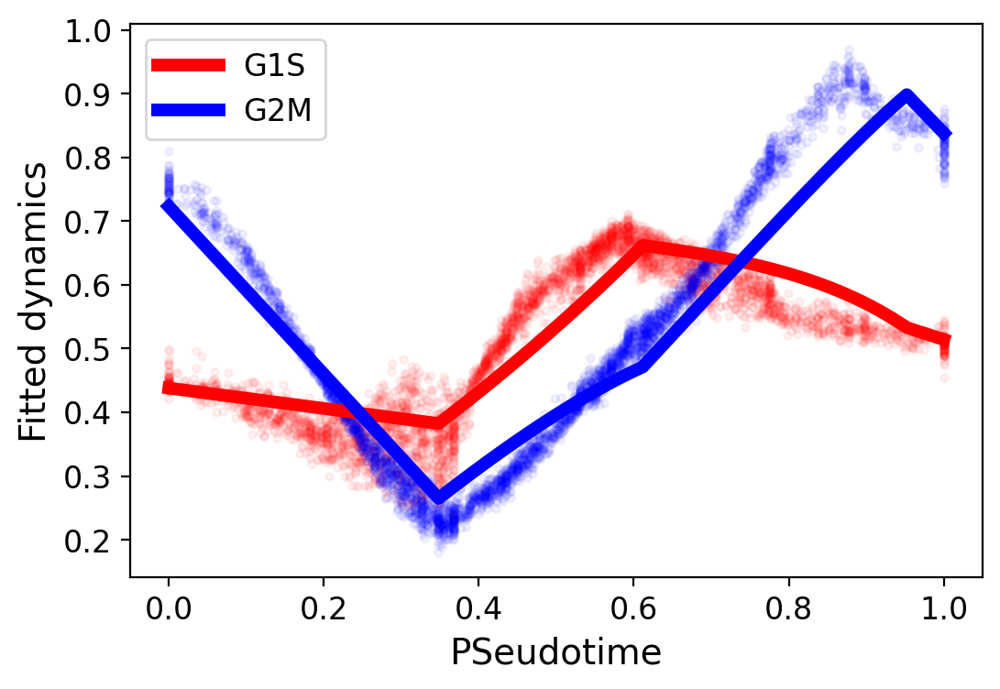

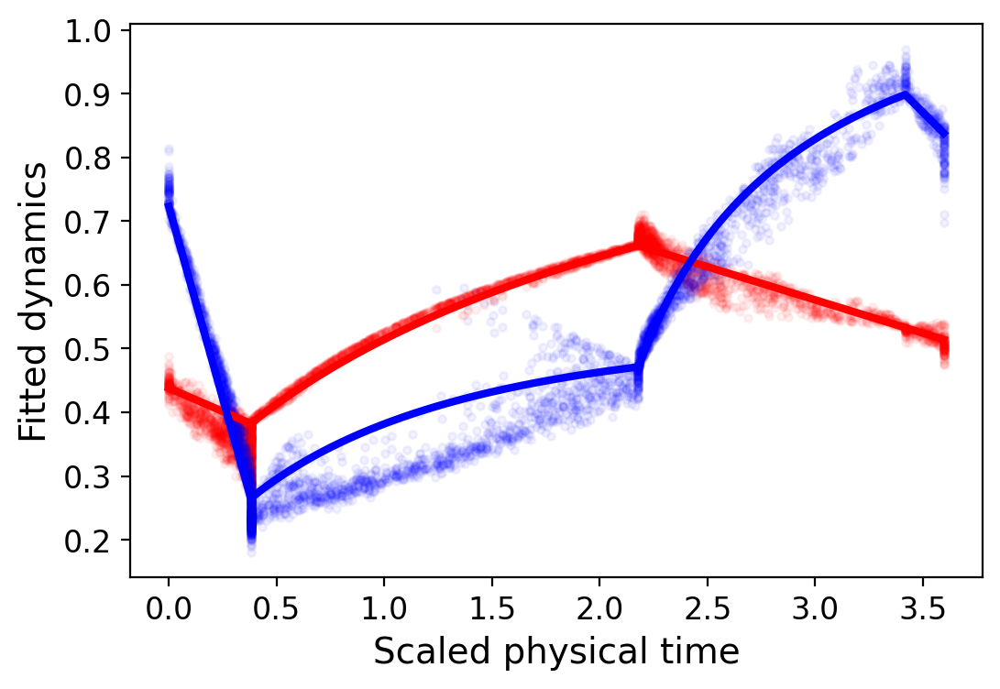

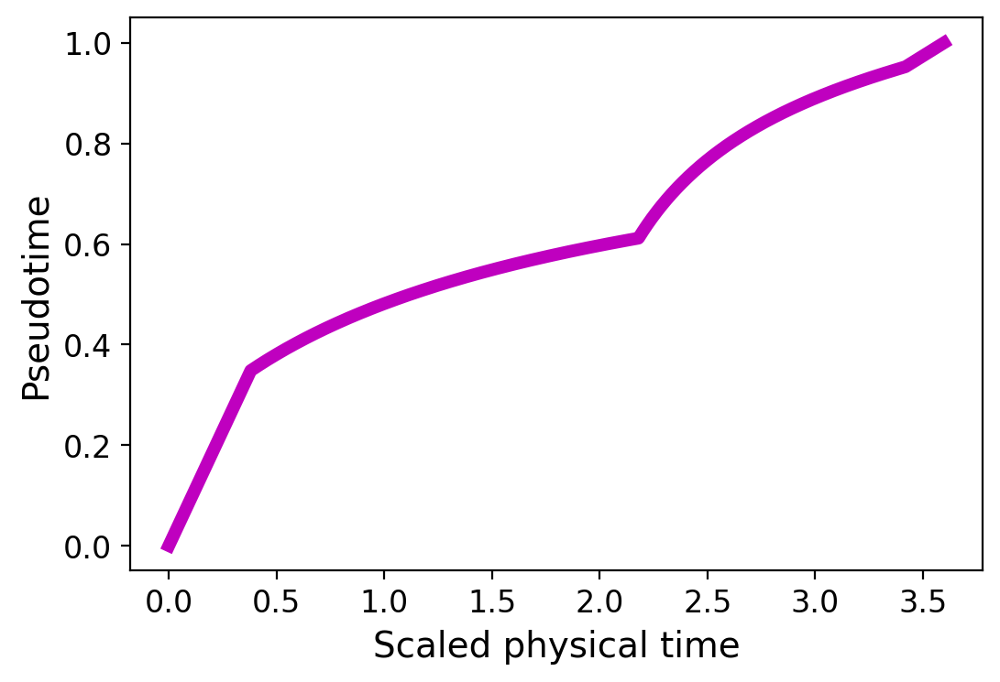

In [251]:
# Plot the fit in real physical and in pseudotime

pseudotime = []
pseudotime.append(0)
for i in range(1,len(g1sa)):
    dx = np.sqrt((g1sa[i]-g1sa[i-1])**2+(g2ma[i]-g2ma[i-1])**2)
    pseudotime.append(pseudotime[-1]+dx)
pseudotime = pseudotime/np.max(pseudotime)

#plt.plot(times,g1sa,'r-',linewidth=3,label='G1S')
#plt.plot(times,g2ma,'g-',linewidth=3,label='G2M')
#plt.plot(times[:-1],g1srhsa,'r--',linewidth=3,label='G1S_RHS')
#plt.plot(times[:-1],g2mrhsa,'g--',linewidth=3,label='G2M_RHS')
plt.plot(pst/max(pst),g1s_exp[points],'r.',alpha=0.05)
plt.plot(pst/max(pst),g2m_exp[points],'b.',alpha=0.05)
plt.plot(pseudotime,g1sa,'r-',linewidth=5,label='G1S')
plt.plot(pseudotime,g2ma,'b-',linewidth=5,label='G2M')


plt.xlabel('PSeudotime',fontsize=14)
plt.ylabel('Fitted dynamics',fontsize=14)

plt.legend()
plt.show()

irx = []
for i in range(len(g1s_exp)):
    d = (g1s_exp[i]-g1sa)**2/np.var(g1sa)+(g2m_exp[i]-g2ma)**2/np.var(g2ma)
    irx.append(np.argmin(d))
irx = np.array(irx)


plt.plot(times[irx],g1s_exp,'r.',linewidth=3,label='G1S',alpha=0.05)
plt.plot(times[irx],g2m_exp,'b.',linewidth=3,label='G2M',alpha=0.05)

plt.plot(times,g1sa,'r-',linewidth=3,label='G1S')
plt.plot(times,g2ma,'b-',linewidth=3,label='G2M')
#plt.plot(times[:-1],g1srhsa,'r--',linewidth=3,label='G1S_RHS')
#plt.plot(times[:-1],g2mrhsa,'g--',linewidth=3,label='G2M_RHS')

plt.xlabel('Scaled physical time',fontsize=14)
plt.ylabel('Fitted dynamics',fontsize=14)
#plt.legend()
plt.show()

plt.plot(times,np.array(pseudotime),'m-',linewidth=5)
plt.xlabel('Scaled physical time',fontsize=14)
plt.ylabel('Pseudotime',fontsize=14)
plt.show()

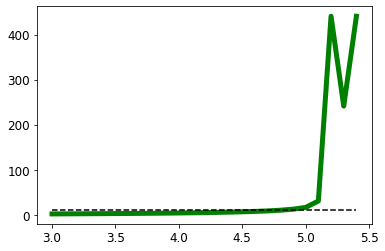

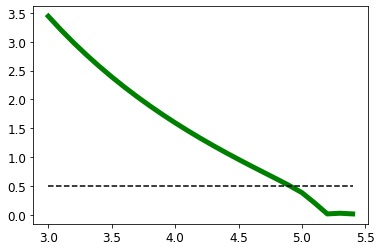

In [201]:
# Auxilarry code to fix the kt_m_fold parameter (acceleration of gene transcription in T2 phase)

kt_m_folds = np.arange(3,5.4,0.1)
T2p_guesses = np.arange(0.1,2,0.05)
Ts_Tms = np.zeros(len(kt_m_folds))
T2_Tss = np.zeros(len(kt_m_folds))
#Ts_Tms = np.zeros(len(T2p_guesses))
#T2_Tss = np.zeros(len(T2p_guesses))
for i,kks in enumerate(kt_m_folds):
#for i,gs in enumerate(T2p_guesses):
    kt_m_fold = kks    
    T2p_guess, no_solution_flag, T2p_tries, errors = find_optimal_T2p(0.0000001,1000,plotting_x0=False)
    #T2p_guess = gs
    T2,Tm,kd_g1s,kd_g2m,kd2_g1s,kd2_g2m,kt_g1s,kt_g2m,kt_m_fold,m_fold,s_fold = compute_parameters_as_function_T2p(T2p_guess)
    #plot_simulated_dynamics(number_of_points=1000)
    Ts_Tms[i] = Ts/Tm
    T2_Tss[i] = T2/Ts
    #print(kks,'T2=',T2,'Ts=',Ts,'Tm=',Tm)
plt.plot(kt_m_folds, Ts_Tms, 'g-',linewidth=5)
plt.plot(kt_m_folds,[10]*len(kt_m_folds),'k--')
#plt.plot(T2p_guesses, Ts_Tms, 'g-',linewidth=5)
#plt.plot(T2p_guesses, T2_Tss, 'm-',linewidth=5)
plt.show()
plt.plot(kt_m_folds, T2_Tss, 'g-',linewidth=5)
plt.plot(kt_m_folds,[0.5]*len(kt_m_folds),'k--')
plt.show()

Errval= 8.159970175734784
Initial smax,ms= (0.6616721, 0.4711494)
kd_g1s= 0.37876034151340604
kd_g2m= 2.87255066088758
kd2_g1s= 0.06901337202489023
kd2_g2m= 0.20530218570114947
kt_g1s= 1.4601854587704877
kt_g2m= 0.6954533203662784
kt_m_fold= 3.5
kt_m_fold= 3.5
m_fold= 1.2528489740913005
s_fold= 1.1715896721922106
T1= 0.38
Ts= 1.7999999999999998
T2= 4.3052261800557305
Tm= 0.6910685089742191
smax,ms= (0.6625252963558681, 0.3651688343322443)


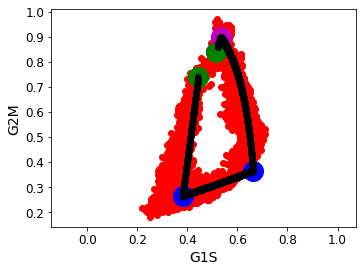

In [195]:
# optimize xs position

def model_traj_approximation_error(_X,_SquaredX,simulation_points):
    # error between trajectory and data
    partition, dists = elpigraph.src.core.PartitionData(X = _X, NodePositions = simulation_points, 
                                                                MaxBlockSize = 100000000, TrimmingRadius = np.inf,
                                                                SquaredX=_SquaredX)
    return np.sum(dists)

def random_optimization(point_to_optimize,number_of_jumps = 100,jump_length = 0.05,verbose=False):
    current_err = np.inf
    position_sequence = []
    global smax, ms, s1, m1
    global T2,Tm,kd_g1s,kd_g2m,kd2_g1s,kd2_g2m,kt_g1s,kt_g2m,m_fold,s_fold
    print('Initial smax,ms=',(smax,ms))
    for i in range(number_of_jumps):
        rnd_angle = (np.random.rand(1)*2*np.pi)[0]
        if point_to_optimize=='s':
            smax_prev = smax
            ms_prev = ms
            smax = smax+jump_length*np.cos(rnd_angle)
            ms = ms+jump_length*np.sin(rnd_angle)
        if point_to_optimize=='1':
            s1_prev = s1
            m1_prev = m1
            s1 = s1+jump_length*np.cos(rnd_angle)
            m1 = m1+jump_length*np.sin(rnd_angle)
        if verbose:
            print('Trying smax,ms=',(smax,ms))
        T2p_guess, no_solution_flag, T2p_tries, errors = find_optimal_T2p(0.0001,50)
        if no_solution_flag:
            print('WARNING: no local optimum for T2p was found!!!')
            if point_to_optimize=='s':
                smax = smax_prev
                ms = ms_prev
            if point_to_optimize=='1':
                smax_prev = s1_prev
                ms_prev = m1_prev                    
        else:
            T2,Tm,kd_g1s,kd_g2m,kd2_g1s,kd2_g2m,kt_g1s,kt_g2m,kt_m_fold,m_fold,s_fold = compute_parameters_as_function_T2p(T2p_guess)    
            T = T1+Ts+T2+Tm
            t_values = np.arange(0,T,T/1000)
            g1sa = np.log10(add_laplacian_noise(G1Sa(t_values),add_noise=0.0))
            g2ma = np.log10(add_laplacian_noise(G2Ma(t_values),add_noise=0.0))
            simul = np.array([g1sa,g2ma]).T
            err_val = model_traj_approximation_error(X_exp,SquaredX_exp,simul)
            #print('Errval=',err_val,'Current err=',current_err)
            if err_val>=current_err:
                if point_to_optimize=='s':
                    smax = smax_prev
                    ms = ms_prev
                    if verbose:
                        print('Iteration',i,':No improvement')
                if point_to_optimize=='1':
                    #print('smax=',smax,'\t','ms=',ms,'\terr=',err_val)
                    smax_prev = s1_prev
                    ms_prev = m1_prev           
                    if verbose:                    
                        print('Iteration',i,':No improvement')
            else:
                    if verbose:                
                        print('Iteration',i,':IMPROVED by ',current_err-err_val)
                    current_err = err_val
    if point_to_optimize=='s':                
        xs[0] = smax
        xs[1] = ms
        position_sequence.append(xs)
    if point_to_optimize=='1':   
        x1[0] = s1
        x1[1] = m1
        position_sequence.append(x1)
    return T2p_guess,position_sequence

#ms = ms_old
#smax = smax_old

T = T1+Ts+T2+Tm
t_values = np.arange(0,T,T/1000)

X_exp = np.array([g1s_exp,g2m_exp]).T
SquaredX_exp = np.sum(X_exp**2,axis=1,keepdims=1)
simul = np.array([g1sa,g2ma]).T
err_val = model_traj_approximation_error(X_exp,SquaredX_exp,simul)
print('Errval=',err_val)


T2p_guess,position_sequence_s = random_optimization('s',jump_length=0.01,verbose=False)
#random_optimization('1')

T = T1+Ts+T2+Tm
times = np.arange(0,T,T/3000)    
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.plot(g1s_exp,g2m_exp,'ro')
plt.plot(x1[0],x1[1],'bo',markersize=20)
plt.plot(xs[0],xs[1],'bo',markersize=20)
plt.plot(x0[0],x0[1],'go',markersize=20)
plt.plot(xf[0],xf[1],'go',markersize=20)
plt.plot(xm[0],xm[1],'mo',markersize=20)
for x in position_sequence_s:
    plt.plot(x[0],x[1],'co',markersize=5)
    

T2p_guess, no_solution_flag, T2p_tries, errors = find_optimal_T2p(0.0001,50)
if no_solution_flag:
    print('WARNING: no local optimum for T2p was found!!!')
T2,Tm,kd_g1s,kd_g2m,kd2_g1s,kd2_g2m,kt_g1s,kt_g2m,kt_m_fold,m_fold,s_fold = compute_parameters_as_function_T2p(T2p_guess)    
g1sa = np.log10(add_laplacian_noise(G1Sa(t_values),add_noise=0.0))
g2ma = np.log10(add_laplacian_noise(G2Ma(t_values),add_noise=0.0))

plot_simulated_dynamics(number_of_points=1000)
print_all_parameters()
plt.axis('equal')

print('smax,ms=',(smax,ms))
T = T1+Ts+T2+Tm



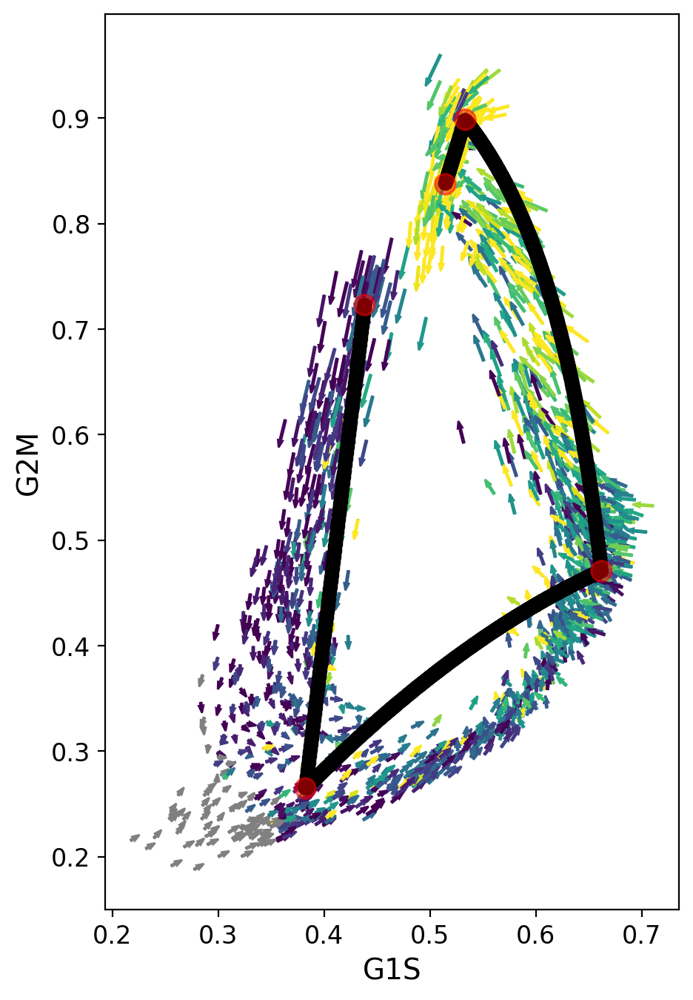

In [254]:
# Draw the model trajectory on top of the data

times = np.arange(0,T,T/3000)
plt.rcParams['figure.dpi'] = 200
scaling_factor = 1

T2,Tm,kd_g1s,kd_g2m,kd2_g1s,kd2_g2m,kt_g1s,kt_g2m,kt_m_fold,m_fold,s_fold = compute_parameters_as_function_T2p(T2p_guess)
g1sa = np.log10(add_laplacian_noise(G1Sa(t_values),add_noise=0.0))
g2ma = np.log10(add_laplacian_noise(G2Ma(t_values),add_noise=0.0))

_make_G1SG2M_plot(adata,[egr_final],subsample=idx_subsample,draw_principal_curve=False,alpha=1.0,scaling_factor=scaling_factor,delta=0.05,score_type=score_type,arrow_width=0.0015)
#plt.plot(g1s_exp,g2m_exp,'r.',markersize=1)
g1sa, g2ma = plot_simulated_dynamics()
plt.plot(x0[0],x0[1],'ro',markersize=10,alpha=0.5)
plt.plot(x1[0],x1[1],'ro',markersize=10,alpha=0.5)
plt.plot(xs[0],xs[1],'ro',markersize=10,alpha=0.5)
plt.plot(xm[0],xm[1],'ro',markersize=10,alpha=0.5)
plt.plot(xf[0],xf[1],'ro',markersize=10,alpha=0.5)
plt.axis('equal')
#plt.xlim(0.6,2.5)
plt.savefig(dataset_name+'_G1S_G2M_fitted_dynamics.png',dpi=600)
plt.show()
#plt.plot(times,g1sa)
#plt.axis('equal')

# Summplementary code: some auxilary functions

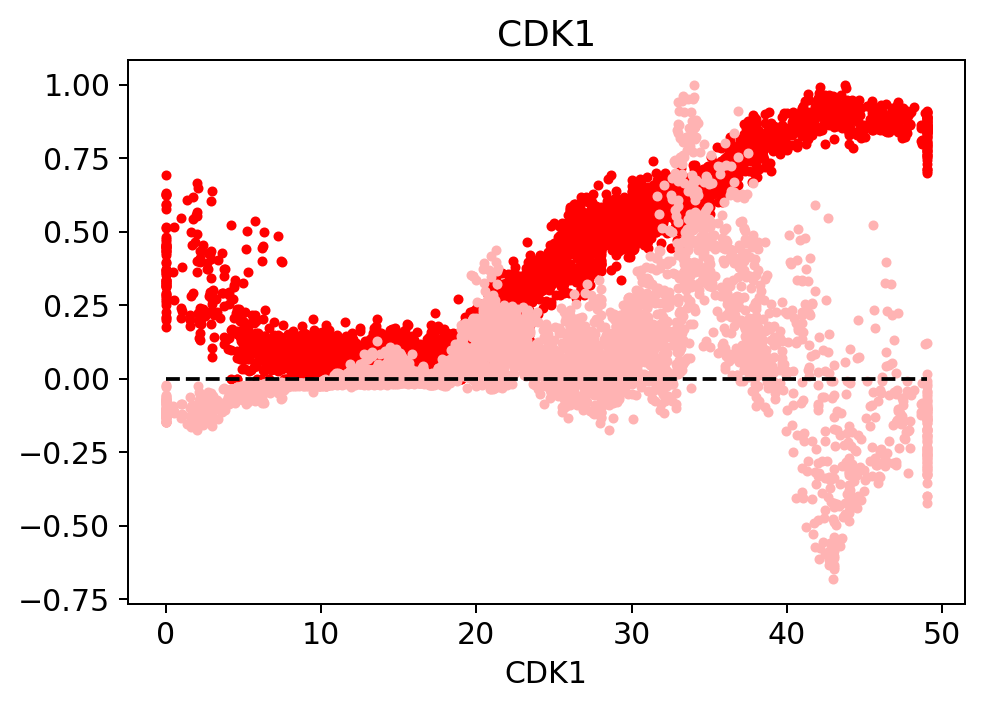

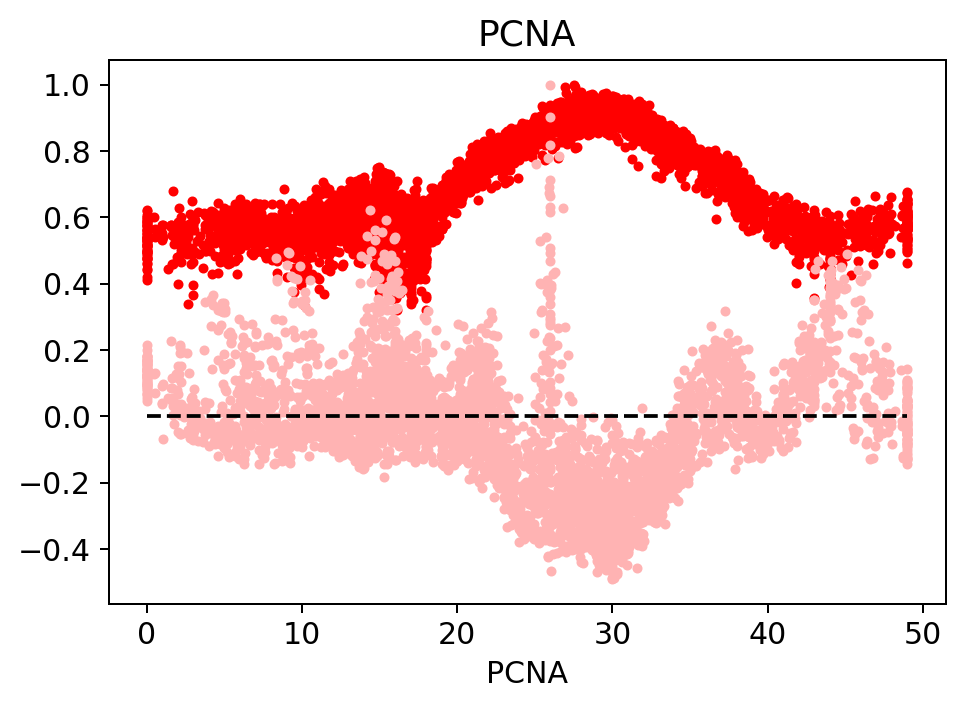

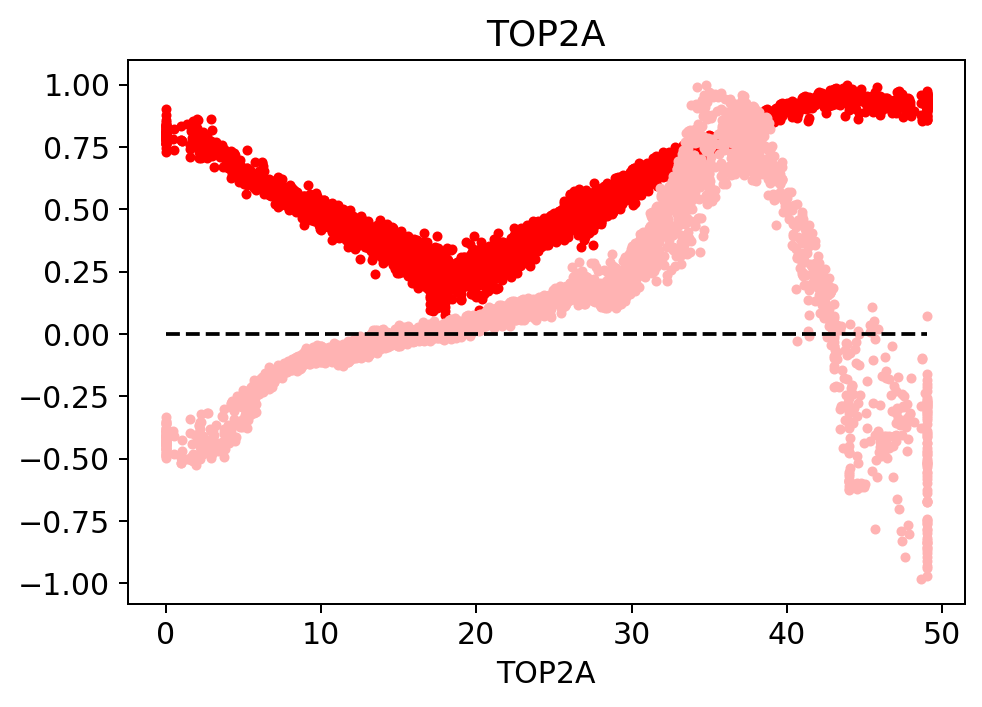

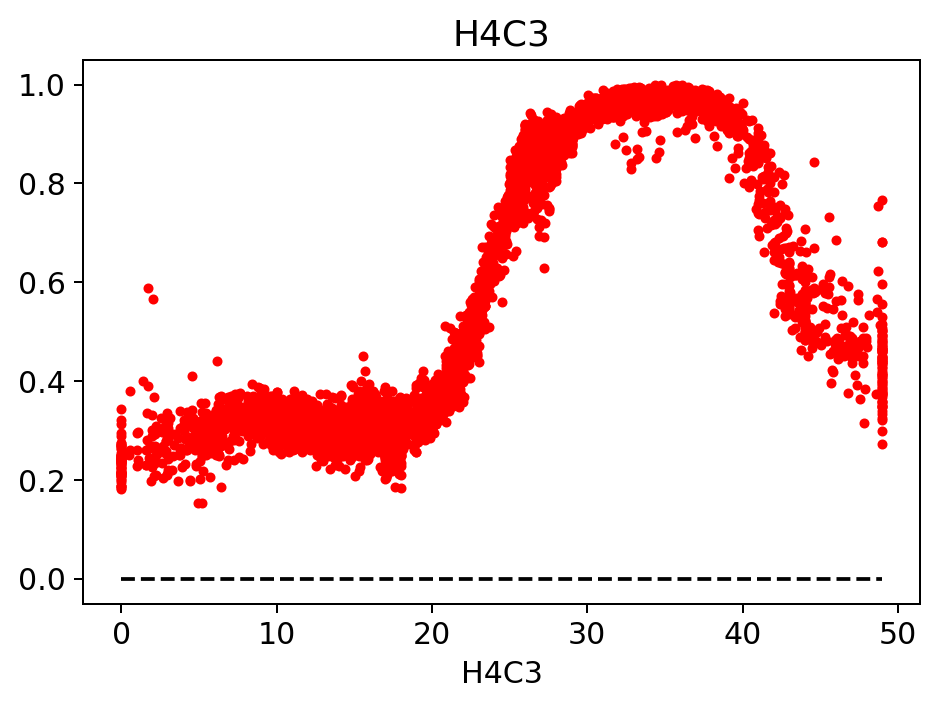

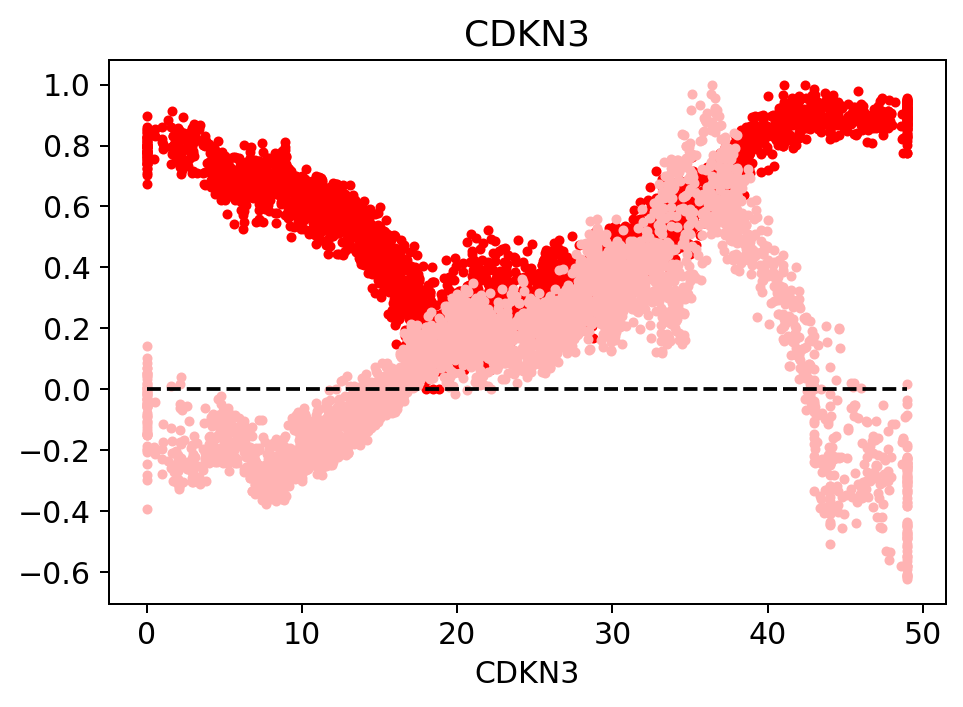

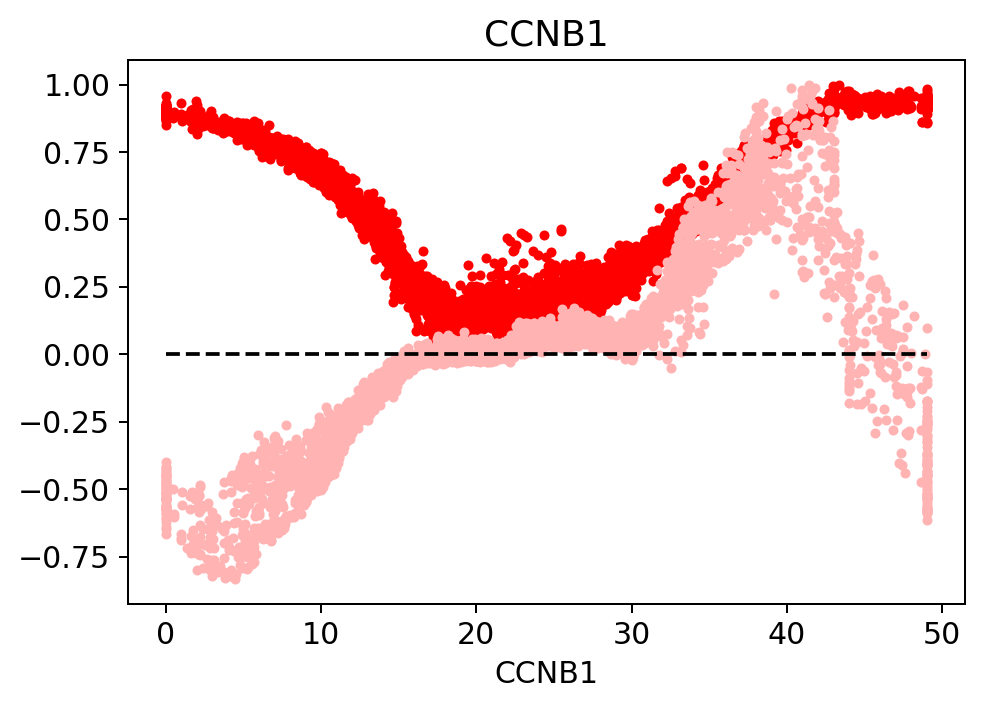

In [81]:
# plot some selected genes, both expression and velocity

genes = ['CDK1','PCNA','TOP2A','H4C3','CDKN3','CCNB1']
for gene in genes:
    x = adata[points,gene].X
    plt.plot(pst,x/np.max(x),'r.')
    v = adata[points,gene].layers['velocity']
    plt.plot(pst,v/np.max(v),'b.',color=[1,0.7,0.7])
    plt.plot([0,np.max(pst)],[0,0],'k--')
    plt.xlabel(gene)
    plt.title(gene)
    plt.show()



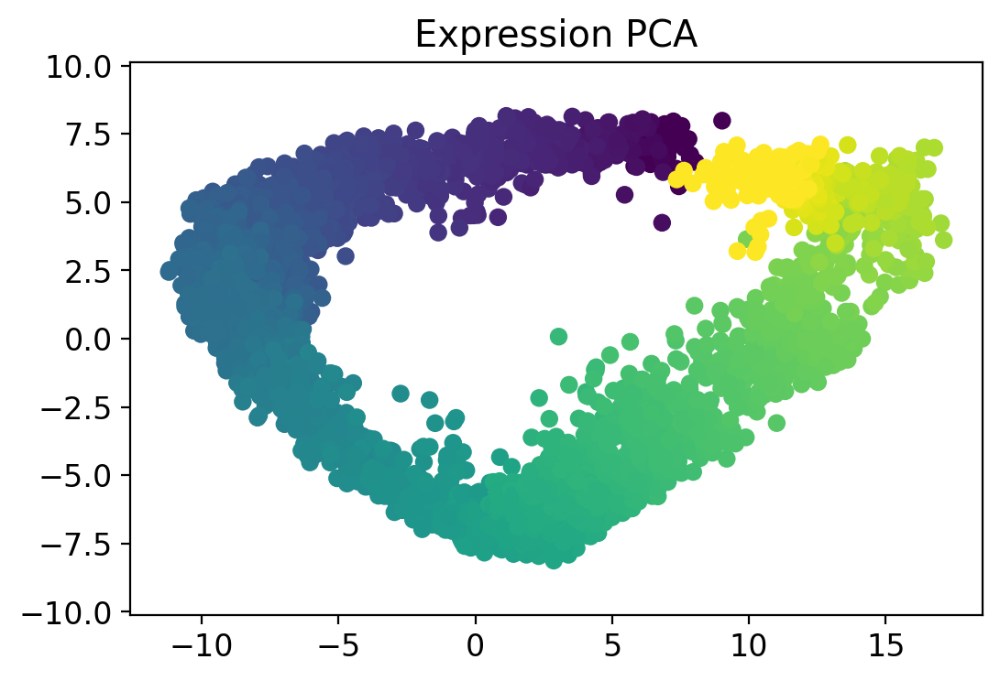

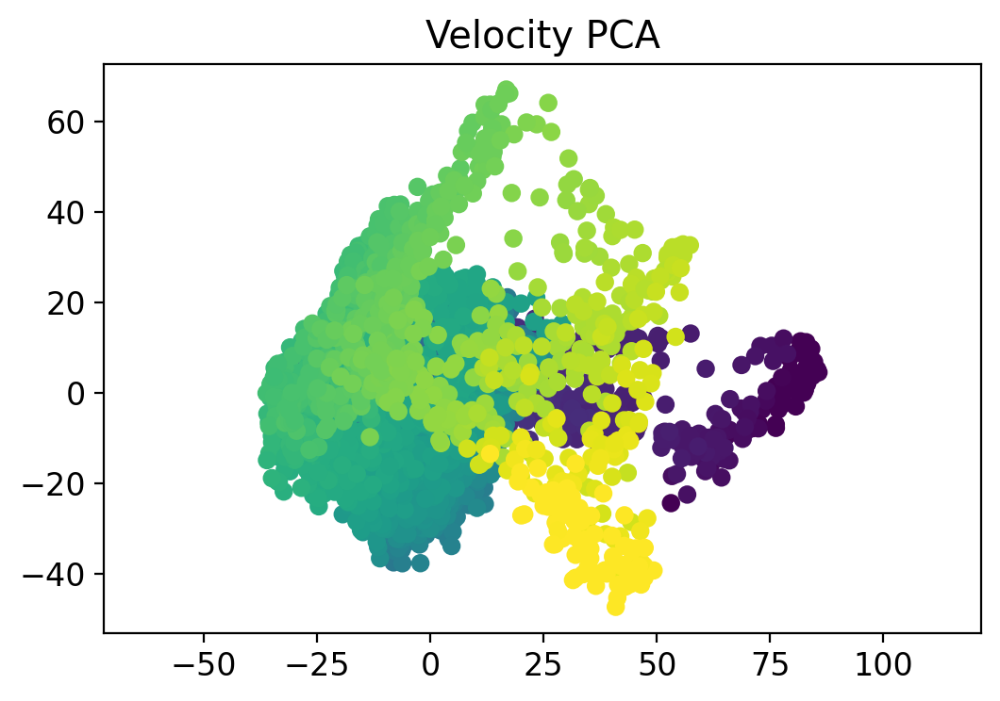

In [255]:
# PCA plot of expression

pca = PCA(n_components=3)
u = pca.fit_transform(adata.X)
plt.scatter(u[points,0],u[points,1],c=pst)
plt.title('Expression PCA')
plt.axis('equal')
plt.show()

pca = PCA(n_components=3)
u = pca.fit_transform(adata.layers['velocity'])
plt.scatter(u[points,0],u[points,1],c=pst)
plt.axis('equal')
plt.title('Velocity PCA')
plt.show()

#s = pca.singular_values_
#plt.plot(np.arange(1,11),s[0:10]/np.sum(s))


(3000,)
(3000,)


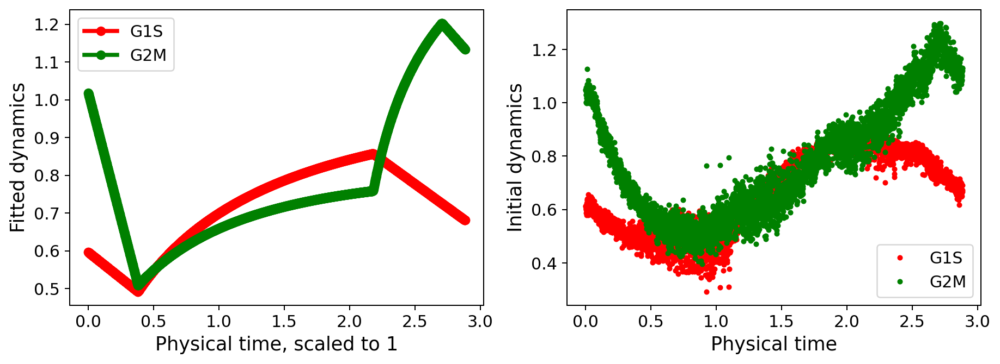

In [83]:
# in case of simulated data, compare with the initial dynamics

#times = np.arange(0,T,T*0.9999/(len(g1sa)))[:-1]
print(times.shape)
print(g1sa.shape)
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.plot(times,g1sa,'ro-',linewidth=3,label='G1S')
plt.plot(times,g2ma,'go-',linewidth=3,label='G2M')
plt.xlabel('Physical time, scaled to 1',fontsize=14)
plt.ylabel('Fitted dynamics',fontsize=14)
plt.legend()
plt.subplot(1,2,2)

# comment next line if this is already simulated
times_exp = np.arange(0,T,T/X.shape[0])    

plt.plot(times_exp,g1s_exp[points],'r.',linewidth=3,label='G1S')
plt.plot(times_exp,g2m_exp[points],'g.',linewidth=3,label='G2M')
plt.xlabel('Physical time',fontsize=14)
plt.ylabel('Initial dynamics',fontsize=14)
plt.legend()
plt.show()

# Part 2: Playing with simulated dynamics

kd_g1s= 0.3379153960670837
kd_g2m= 2.7747959089018077
kd2_g1s= 0.2395420924136414
kd2_g2m= 0.7777206089227555
kt_g1s= 2.0663950819373564
kt_g2m= 2.5868079745238184
kt_m_fold= 3.3
kt_m_fold= 3.3
m_fold= 1.3020369473035038
s_fold= 1.191417870097576
T1= 0.38
Ts= 1.7999999999999998
T2= 1.2380339231059982
Tm= 0.1802259973588157
T1 =  0.38 , T2 =  1.2380339231059982 , Ts =  1.7999999999999998
Correlation= 0.29999760166106304
Total std= 0.1516852304164037
Van Valen's CV= 0.2752209951972532


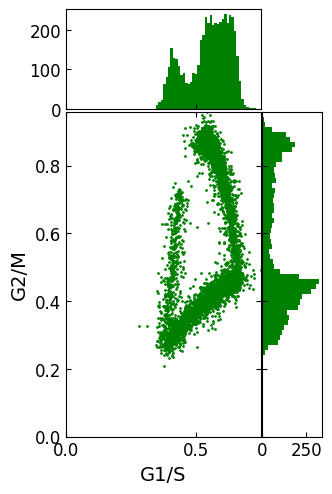

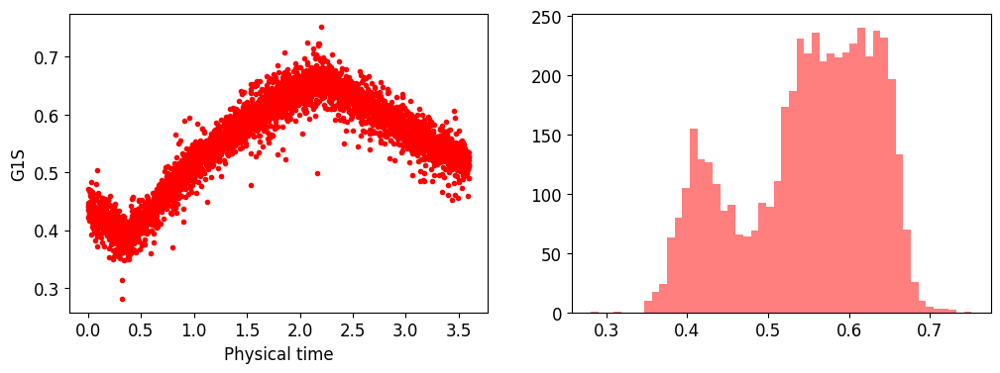

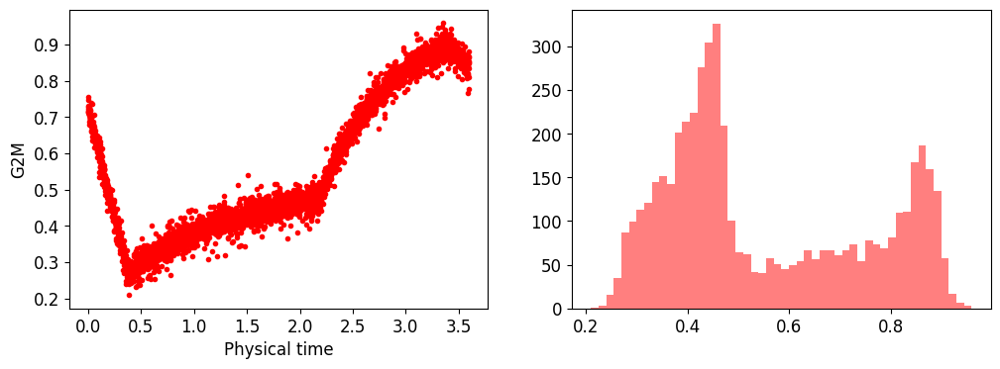

In [315]:
# simulate some dynamics and also show the effect of the decreasing T1 and T2

plt.rcParams['figure.dpi'] = 100

colors = ['r','g','b','m','k']

print_all_parameters()

if False:
    T1 = 0.2
    Ts = 0.2
    T2 = 0.7
    Tm = 0.3

    T = T1+Ts+T2+Tm
    m_fold = 1.5
    s_fold = 2

    kd_g2m = 2
    kd2_g2m = 0.8
    kt_g2m = 150

    kd_g1s = 1.5
    kd2_g1s = 1
    kt_g1s = 100

    
g1sa = np.log10(add_laplacian_noise(G1Sa(times),add_noise=0.03))
g2ma = np.log10(add_laplacian_noise(G2Ma(times),add_noise=0.03))
g1s_max = np.max(g1sa)
g2m_max = np.max(g2ma)
    
    
T1_backup = T1
T2_backup = T2
Ts_backup = Ts
#T1s = np.array([T1,1/5*T1,1/10*T1,0])
T1/=1
T2/=1
Ts/=1
T1s = np.array([T1])

times_list = []
T1_list = []
T2_list = []
g1sa_list = []
g2ma_list = []


plt.figure(figsize=(3,5))
for i,t1 in enumerate(T1s):
    #T1 = t1
    #T2 = T2_backup*(t1/T1_backup)**(1/2)
    #T2 = T2_backup
    print('T1 = ',T1,', T2 = ',T2,', Ts = ',Ts)
    T = T1+Ts+T2+Tm
    T1_list.append(T1)
    T2_list.append(T2)
    times = np.arange(0,T,T/5000)
    g1sa = np.log10(add_laplacian_noise(G1Sa(times),add_noise=0.03))
    g2ma = np.log10(add_laplacian_noise(G2Ma(times),add_noise=0.03))
    times_list.append(times)
    g1sa_list.append(g1sa)
    g2ma_list.append(g2ma)
    #plt.plot(g1sa,g2ma,'.',color=colors[i],label='T1='+str(T1)+', T2='+('%2.1f'%(T2)))
    scatter_with_histograms(g1sa,g2ma,xlabel='G1/S',ylabel='G2/M',color='g',xlim=(0,np.max((np.max(g1sa),g1s_max))),ylim=(0,np.max((np.max(g2ma),g2m_max))))
    
    
#plt.xlabel('G1/S')
#plt.ylabel('G2/M')
#plt.legend()
#plt.axis('equal')
plt.show()
T1 = T1_backup
T2 = T2_backup
Ts = Ts_backup

plt.figure(figsize=(12,4))
for i,t1 in enumerate(T1s):
    plt.subplot(1,2,1)
    plt.plot(times_list[i],g1sa_list[i],colors[i]+'.')
    plt.ylabel('G1S')
    plt.xlabel('Physical time')    
    plt.subplot(1,2,2)
    plt.hist(g1sa_list[i],color=colors[i],bins=50,alpha=0.5)
plt.show()

plt.figure(figsize=(12,4))
for i,t1 in enumerate(T1s):
    plt.subplot(1,2,1)
    plt.plot(times_list[i],g2ma_list[i],colors[i]+'.')
    plt.ylabel('G2M')
    plt.xlabel('Physical time')    
    plt.subplot(1,2,2)
    plt.hist(g2ma_list[i],color=colors[i],bins=50,alpha=0.5)
plt.show()

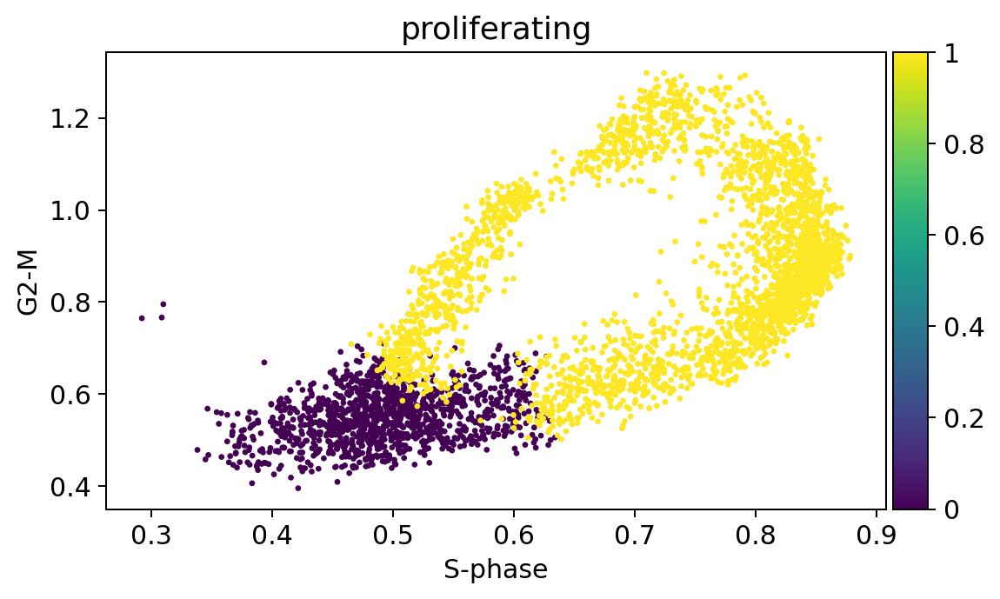

The initial number of nodes must be at least 3. This will be fixed
Generating the initial configuration
Creating a circle in the plane induced by the 1st and 2nd PCs with 3 nodes
90% of the points have been used as initial conditions. Resetting.
Constructing tree 1 of 1 / Subset 1 of 1
Performing PCA
Using standard PCA
2 dimensions are being used
100.0 % of the original variance has been retained
The elastic matrix is being used. Edge configuration will be ignored
Computing EPG with  50.0  nodes on  2896  points and  2  dimensions
Nodes =  3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 

BARCODE	ENERGY	NNODES	NEDGES	NRIBS	NSTARS	NRAYS	NRAYS2	MSE	MSEP	FVE	FVEP	UE	UR	URN	URN2	URSD

0||50	0.0015	50	50	50	0	0	0	0.0008	0.0008	0.9821	0.9837	0.0004	0.0002	0.0114	0.5704	0


MSDEnergyPlot not yet implemented
accuracyComplexityPlot not yet implemented
2.862  seconds elapsed


Iteration 0 Fraction of non-prolif

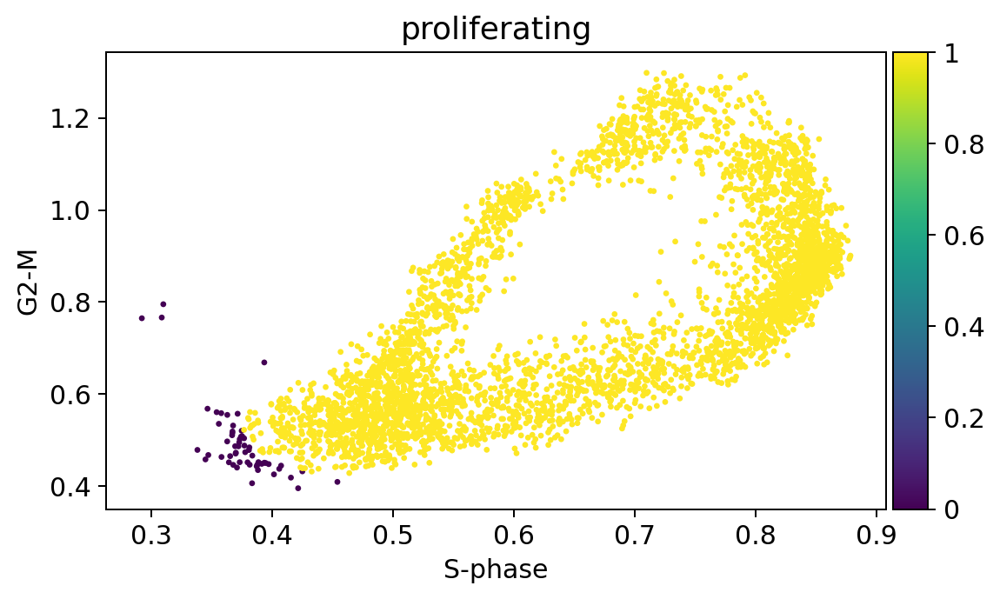

In [234]:
find_nonproliferative_cells(adata,number_of_sigmas=5)
sc.pl.scatter(adata,x='S-phase',y='G2-M',color='proliferating')

Correlation= 0.4323960669479396
Total std= 0.05532000065247137
Van Valen's CV= 0.22104488668111674


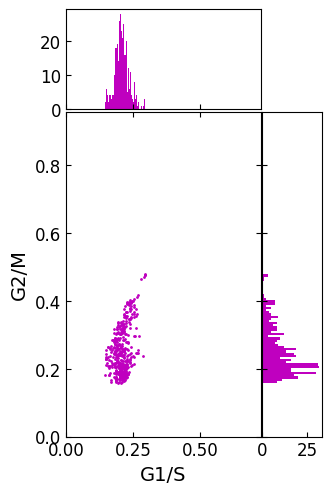

In [317]:
#dataset_name1 = '/mnt/c/Datas/SingleCellTranscriptomics/RNAVelocity/CHLA10'
#dataset_name1 = '/mnt/c/Datas/SingleCellTranscriptomics/Broad_CellLine/cell_lines_umi/CHLA10'
#dataset_name1 = '/mnt/c/Datas/SingleCellTranscriptomics/Broad_CellLine/cell_lines_umi/TC71'
dataset_name1 = '/mnt/c/Datas/SingleCellTranscriptomics/Broad_CellLine/cell_lines_umi/YD38_UPPER_AERODIGESTIVE_TRACT'
    
adata1 = sc.read_h5ad(dataset_name1+'_renorm_proc.h5ad')

signature_dict = {'S-phase':adata.uns['S-phase_genes'],'G2-M':adata.uns['G2-M_genes']}
score_type = 'simple'
if score_type=='additive':
    scores_dic = calc_scores_additive(adata1,signature_dict)
else:
    scores_dic = calc_scores(adata1,signature_dict)
for s in scores_dic:
    adata1.obs[s] = scores_dic[s]

g1sa = adata1.obs['S-phase']
g2ma = adata1.obs['G2-M']
plt.figure(figsize=(3,5))
scatter_with_histograms(g1sa,g2ma,xlabel='G1/S',ylabel='G2/M',color='m',xlim=(0,np.max((np.max(g1sa),g1s_max))),ylim=(0,np.max((np.max(g2ma),g2m_max))))

# Part 3. Determining the accuracy of extensiveness

In [161]:
adata_orig = sc.read_h5ad('/mnt/c/Datas/SingleCellTranscriptomics/Broad_CellLine/cell_lines_umi/CHLA9_raw.h5ad')
#adata_orig = sc.read_h5ad(dataset_name+'_renorm.h5ad')
adata_orig1 = adata_orig[adata.obs_names,:]

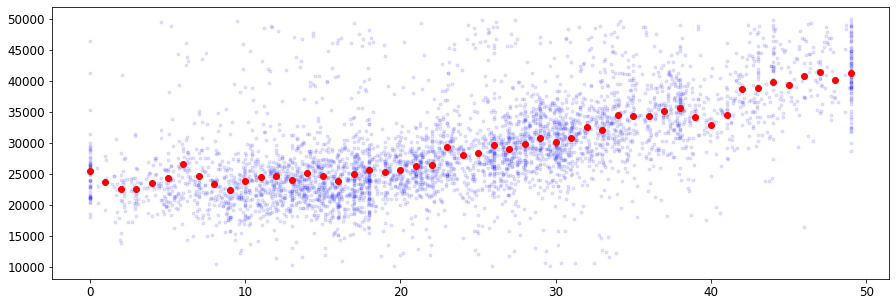

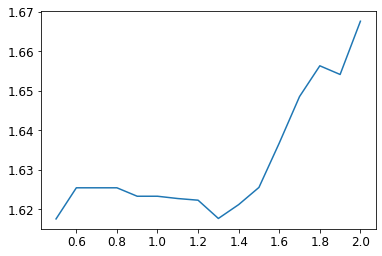

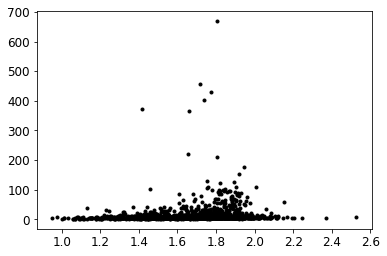

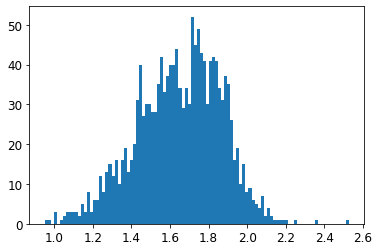

Mean ratio= 1.6485745
Std ratio= 0.21854152
Mean ratio for S genes: 1.5956533
Ratio for all S gene counts: 1.420868320969989
Mean ratio for G2/M genes: 1.5662967
Ratio for all G2/M gene counts: 1.3825524667301752


In [182]:
# Cell division additivity analysis

total_counts = adata.obs['total_counts']
total_counts_orig = adata_orig1.obs['total_counts']
total_counts_orig1 = np.sum(adata_orig1.X,axis=1)
plt.figure(figsize=(15,5))
plt.plot(pst,total_counts_orig[points],'b.',alpha=0.1)
#plt.plot(pst,total_counts_orig1[points],'b.',alpha=0.1)
#plt.plot(pst,total_counts[points],'k.')

#nodep = adata.uns['ElasticGraph_nodes']
#X = adata.obsm['X_pca']
#partition, dists = elpigraph.src.core.PartitionData(X = X, NodePositions = nodep, 
#                                                        MaxBlockSize = 100000000, TrimmingRadius = np.inf,
#                                                        SquaredX = np.sum(X**2,axis=1,keepdims=1))
#smoothed_totals = []
#number_of_cells = []
#for k in range(nodep.shape[0]):
#    smoothed_totals.append(np.mean(total_counts_orig[np.where(partition==k)[0]]))
#    number_of_cells.append(len(np.where(partition==k)[0]))
#smoothed_totals = np.array(smoothed_totals)
#number_of_cells = np.array(number_of_cells)

smoothed_totals = []
number_of_cells = []
for k in range(nodep.shape[0]):
    irx = np.where((pst>k-0.5)&(pst<=k+0.5))[0]
    smoothed_totals.append(np.mean(total_counts_orig[points][irx]))
    number_of_cells.append(len(irx))

plt.plot(smoothed_totals,'ro')
plt.show()

ratios_total = []
border_vals = []
#for border in np.arange(1.0,nodep.shape[0]/2,1.0):
for border in np.arange(0.5,2.01,0.1):
    irx_start = np.where(pst<border)[0]
    start_count = np.mean(total_counts_orig[points][irx_start])
    irx_end = np.where(pst>nodep.shape[0]-border-1)[0]
    end_count = np.mean(total_counts_orig[points][irx_end])
    #print('Border,Start,End,Ratio = ',border,start_count,end_count,end_count/start_count)
    border_vals.append(border)
    ratios_total.append(end_count/start_count)

plt.plot(border_vals,ratios_total)
plt.show()

gene_names = list(adata_orig1.var_names)
genes = []
ratios = []
means = []
X = np.array(adata_orig1.X)
min_val = 3
with open(dataset_name+'_gene_division_ratios.txt','w') as f:
    for i,gn in enumerate(gene_names):
        gene_profile = X[:,i]
        start_count_g = np.mean(gene_profile[points][irx_start])
        end_count_g = np.mean(gene_profile[points][irx_end])
        if (start_count_g>min_val)&(end_count_g>min_val):
            genes.append(gn)
            ratios.append(end_count_g/start_count_g)
            means.append(np.mean(gene_profile))
            #print(gn,end_count_g/start_count_g,np.mean(gene_profile))
            f.write(gn+'\t'+str(end_count_g/start_count_g)+'\t'+str(np.mean(gene_profile))+'\n')

plt.plot(ratios,means,'k.')
plt.show()
plt.hist(ratios,bins=100)
plt.show()

print('Mean ratio=',np.mean(ratios))
print('Std ratio=',np.std(ratios))
            
s_ratios = []
s_read_start = 0
s_read_end = 0
for g in list(adata.uns['S-phase_genes']):
    if g in genes:
        s_ratios.append(ratios[genes.index(g)])
        s_read_start+=np.sum(X[irx_start,gene_names.index(g)])
        s_read_end+=np.sum(X[irx_end,gene_names.index(g)])
print('Mean ratio for S genes:',np.mean(s_ratios))
print('Ratio for all S gene counts:',s_read_end/s_read_start)

m_ratios = []
m_read_start = 0
m_read_end = 0
for g in list(adata.uns['G2-M_genes']):
    if g in genes:
        m_ratios.append(ratios[genes.index(g)])
        m_read_start+=np.sum(X[irx_start,gene_names.index(g)])
        m_read_end+=np.sum(X[irx_end,gene_names.index(g)])
print('Mean ratio for G2/M genes:',np.mean(m_ratios))    
print('Ratio for all G2/M gene counts:',m_read_end/m_read_start)
    
#plt.figure(figsize=(15,5))
#plt.plot(number_of_cells,'ko-')
#plt.show()

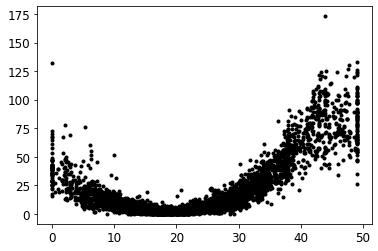

In [163]:
plt.plot(pst,X[:,gene_names.index('TOP2A')][points],'k.')

# Part IV. Cell cycle trajectory dimensionality analysis

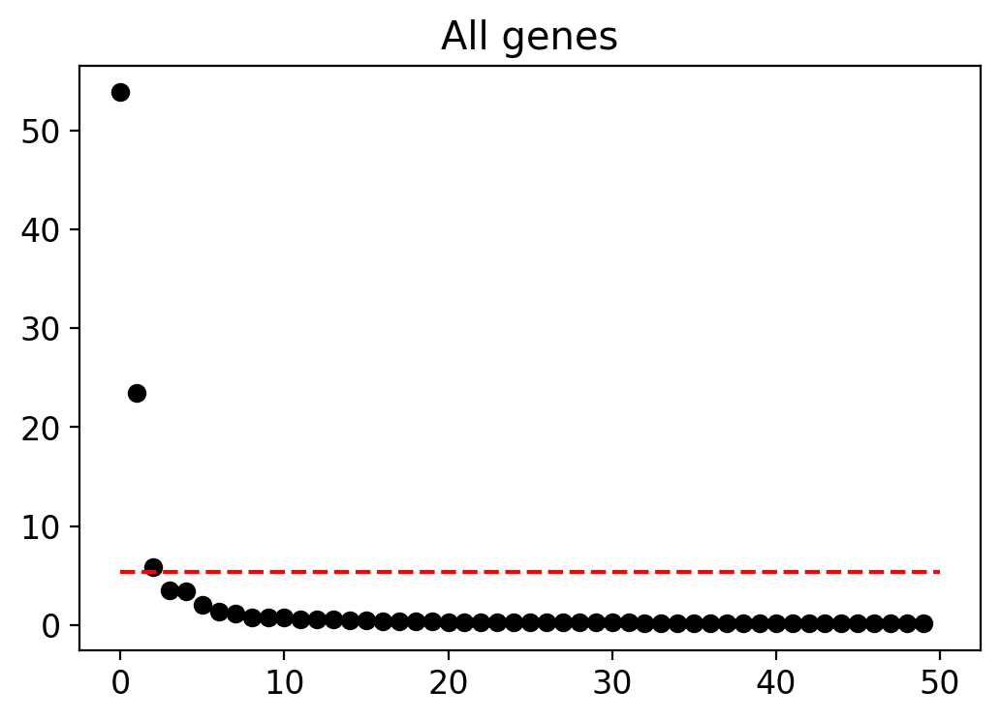

number_of_genes= 198


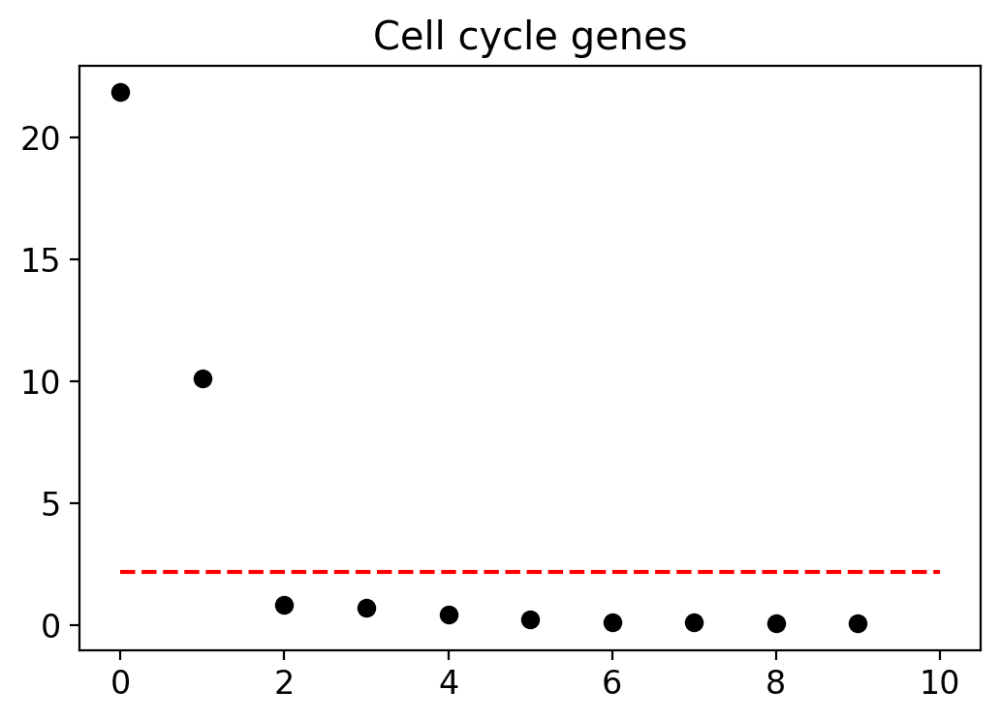

Explained relative variance= [0.5742345  0.26566565 0.02206525 0.01908861 0.01199848 0.00619113
 0.00329679 0.00287687 0.00262113 0.00206077]
FisherS 1.8815792023392859
ESS 2.9252283200924234
alphaF0= 2
BS 4
MaxGap 2
Kaiser 7
fan 2
ratio 7


In [94]:
# Analysis of trajectory dimensionality

from scipy import stats
import skdim

n_components = 50
pca = PCA(n_components=n_components)
u = pca.fit_transform(adata.X)
v = pca.components_.T
s = pca.explained_variance_
plt.plot(s[0:n_components],'ko')
plt.plot([0,n_components],[s[0]/10,s[0]/10],'r--')
plt.title('All genes')
plt.show()


#print(adata)
#fn = '/mnt/c/Datas/SingleCellTranscriptomics/RNAVelocity/cell_cycle_genes_reactome_extended.txt'
fn = '/mnt/c/Datas/SingleCellTranscriptomics/RNAVelocity/cell_cycle_genes_reactome.txt'
#fn = '/mnt/c/Datas/SingleCellTranscriptomics/RNAVelocity/regev_lab_cell_cycle_genes.txt'
#fn = '/mnt/c/Datas/SingleCellTranscriptomics/RNAVelocity/CHLA9_cellcycle_genes.txt'
cc_genes = []
with open(fn) as f:
    cc_genes = f.readlines()
cc_genes = [s[:-1] for s in cc_genes]
cc_genes = list(set(cc_genes) & set(adata.var_names))
adata_cc = adata[:,cc_genes]
#print(adata_cc)
print('number_of_genes=',len(cc_genes))
n_components = 10
pca = PCA()
X = np.array(adata_cc.X)
#X = stats.zscore(X)
u = pca.fit_transform(X)
v = pca.components_.T
s = pca.explained_variance_
plt.plot(s[0:n_components],'ko')
plt.plot([0,n_components],[s[0]/10,s[0]/10],'r--')
plt.title('Cell cycle genes')
plt.show()

print('Explained relative variance=',s[0:n_components]/np.sum(s))

res = skdim.lid.FisherS(conditional_number=10).fit(adata_cc.X)
print('FisherS',res.dimension_)
res = skdim.lid.ESS().fit(X)
print('ESS',res.dimension_)
#res = skdim.gid.TwoNN().fit(adata_cc.X)
#print(res.dimension_)
res = skdim.lid.lPCA(alphaFO=.1).fit(X)
print('alphaF0=',res.dimension_)
#res = skdim.gid.DANCo().fit(adata_cc.X)
#print(res.dimension_)
res = skdim.lid.lPCA(ver='broken_stick').fit(X)
print('BS',res.dimension_)
res = skdim.lid.lPCA(ver='maxgap').fit(X)
print('MaxGap',res.dimension_)
res = skdim.lid.lPCA(ver='Kaiser').fit(X)
print('Kaiser',res.dimension_)
res = skdim.lid.lPCA(ver='fan').fit(X)
print('fan',res.dimension_)
res = skdim.lid.lPCA(ver='ratio',alphaRatio=0.9).fit(X)
print('ratio',res.dimension_)


[10 19 28 43]


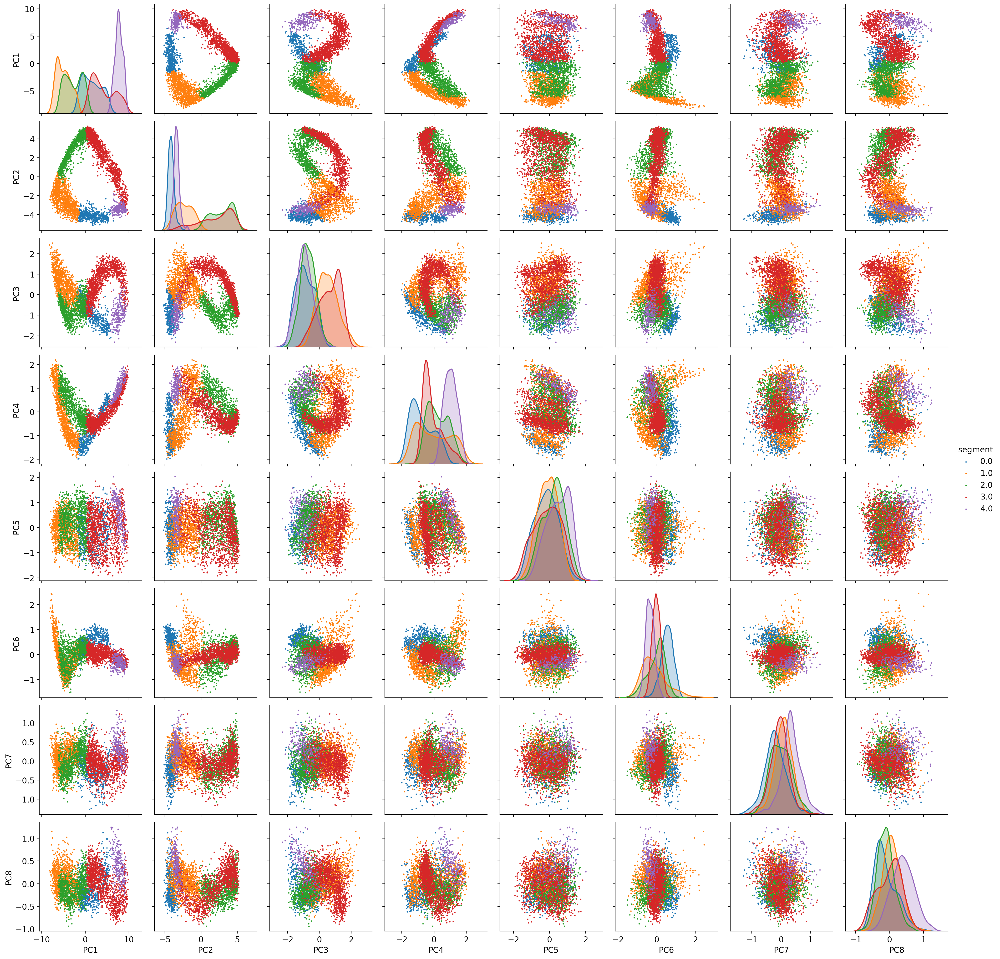

In [46]:
#plt.plot(pst)
irx_segments = np.zeros(len(adata_cc))
curvature_peaks_int = [-1.0] + list(curvature_peaks) + [np.max(pst)]
print(curvature_peaks)
for i,x in enumerate(pst):
    irx_seg = -1
    for k in range(len(curvature_peaks_int)-1):
        if (x>curvature_peaks_int[k]) & (x<=curvature_peaks_int[k+1]):
            irx_seg = k
    #irx_segments.append(irx_seg)
    irx_segments[points[i]] = irx_seg
#print(irx_segments)
#plt.plot(irx_segments,pst)

import seaborn as sns
dt = {}
for k in range(8):
    dt['PC'+str(k+1)] = u[:,k]
dt['segment'] = irx_segments
sns.pairplot(data=pd.DataFrame(data=dt),hue='segment',plot_kws=dict(marker=".",size=10,linewidth=0))
plt.savefig(dataset_name+'_PCA_pairplot.png')
plt.show()

(198, 5)
0
1
2
3
4
[[1.         0.45669613 0.31382756 0.72612041 0.44223576]
 [0.45669613 1.         0.25600901 0.6940336  0.18693257]
 [0.31382756 0.25600901 1.         0.02418487 0.24229969]
 [0.72612041 0.6940336  0.02418487 1.         0.49533384]
 [0.44223576 0.18693257 0.24229969 0.49533384 1.        ]]
[1.         0.32265624 0.29208465 0.14256607 0.03086263]


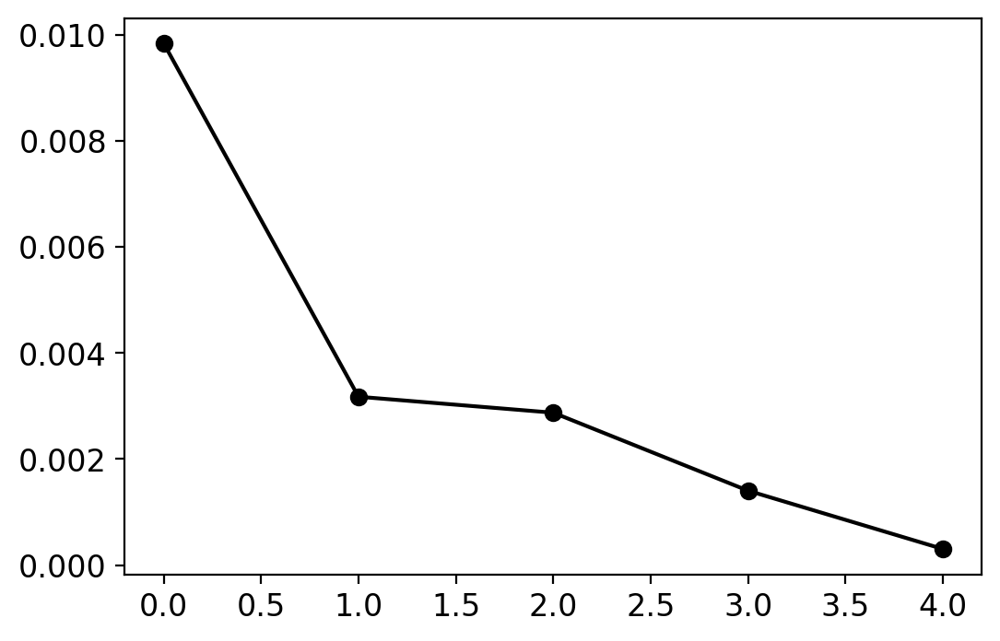

In [91]:
# compute the approximate rank of the matrix containing normalized principal directions of trajectory segments

X = adata_cc.X
segment_vectors = np.zeros((X.shape[1],int(np.max(irx_segments))+1))
#irx_segments1 = np.random.permutation(irx_segments)[points]
irx_segments1 = irx_segments

print(segment_vectors.shape)
for i in range(int(np.max(irx_segments)+1.5)):
    print(i)
    pca = PCA(n_components=1)
    irx = np.where(irx_segments1==i)[0]
    pca.fit(X[irx,:])
    v = pca.components_
    segment_vectors[:,i] = v
#print(segment_vectors)

cr = np.abs(np.corrcoef(segment_vectors.T))
print(cr)

pca = PCA()
pca.fit(segment_vectors)
s = pca.explained_variance_
plt.plot(s,'ko-')
print(s/np.max(s))